## Distributed Adversarial Region (DAR) Attack

# Set up



In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import scipy as sp
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Sequential
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2
import os
from tqdm import tqdm
from mpl_toolkits.axes_grid1 import ImageGrid

Setting up image axes

In [3]:
mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

## Loading models

MobileNetV2

In [4]:
mobilenetv2 = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
mobilenetv2.trainable = False

# ImageNet labels
mobilenetv2_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

14536120/14536120 [==============================] - 0s 0us/step


NasNet

In [5]:
nasnet = tf.keras.applications.NASNetMobile(include_top=True,
                                                     weights='imagenet')
nasnet.trainable = False

# ImageNet labels
nasnet_predictions = tf.keras.applications.nasnet.decode_predictions

24227760/24227760 [==============================] - 0s 0us/step


Densenet169

In [6]:
densenet = tf.keras.applications.DenseNet169(include_top=True,
                                                     weights='imagenet')
densenet.trainable = False

# ImageNet labels
densenet_predictions = tf.keras.applications.densenet.decode_predictions

58541896/58541896 [==============================] - 0s 0us/step


# Set up functions (image preprocessing etc)

In [7]:
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

# Function to extract labels from probability vector
def get_imagenet_label(probs):
  return mobilenetv2_predictions(probs, top=1)[0][0]

image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_1/obj6__10.png")
image = tf.image.decode_image(image_raw)
image = preprocess(image)
image_probs = mobilenetv2.predict(image)

def gen_mod_results():
  results = pd.DataFrame(
    {'imgclassmobilenet': imgclassmobilenet,
     'predsmobilenet': predsmobilenet,
     'imgclassnasnet': imgclassnasnet,
     'predsnasnet': predsnasnet
    })
  return results

import scipy.misc

def display_save_images(image, filename, obj):
  plt.figure()
  plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
  _, image_class, class_confidence = get_imagenet_label(image_probs)
  #scipy.misc.toimage(image).save("/content/gdrive/MyDrive/Data/DAR_data/Pet_object_1/"+str(filename)+".png")
  #ax=fig.add_subplot(1,1,1)
  #extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
  plt.axis('off')
  plt.savefig("/content/gdrive/MyDrive/Data/DAR_data/Pet_"+str(filename)+".png", bbox_inches='tight', transparent=True, pad_inches=0)
  plt.show()
  
def display_images(image):
  plt.figure()
  plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
  _, image_class, class_confidence = get_imagenet_label(image_probs)
  plt.show()

1/1 [==============================] - 3s 3s/step


# DAR function to create random DARs (non region optimised)

In [8]:
#Create new blank image to build DARs on
#defining the function to clip values
def clip_eps(tensor, eps):
	# clip the values of the tensor to a given range and return it
	return tf.clip_by_value(tensor, clip_value_min=-eps,
		clip_value_max=eps)
 
def create_dars():
  dars = np.zeros(150528)
  dars = dars.reshape(1,224,224,3)
  return dars

car = "Object_1"
cup = "Object_2"
frog = "Object_3"
plate = "Object_4"
tank = "Object_5"
boat = "Object_6"
sandwich = "Object_7"
duck = "Object_8"

def create_adv_dars(obj):
  #Indices of labels
  real_label_index = 751 #Aircraft carrier
  image_probs = mobilenetv2.predict(image)

  #Real label - air carrier
  real_label = tf.one_hot(real_label_index, image_probs.shape[-1])
  real_label = tf.reshape(real_label, (1, image_probs.shape[-1]))

  loss_object = tf.keras.losses.CategoricalCrossentropy()
  input_image = image

  LR = 5e-3
  EPS = 2 / 255.0 #Clipping the delta values so it's not too obvious
  iterations = 5
  epsilons = 4

  #Defining image and optimiser
  delta = tf.Variable(tf.zeros_like(image), trainable=True)
  baseImage = tf.constant(image, dtype=tf.float32)
  #delta2 = tf.constant(image, dtype=tf.float32)
  optimizer = tf.keras.optimizers.Adam(learning_rate=LR)

  dars = create_dars()

  #DAR1
  #performing the (untargeted) optimisation, generating perturbation vector
  for iteration in range(0, iterations):  
    with tf.GradientTape() as tape:
      tape.watch(delta[0,75:90,75:90])   
      adversary = baseImage + delta
      prediction = mobilenetv2(adversary)
 
      real_loss = loss_object(real_label, prediction)
      #target_loss = loss_object(target_label, prediction)
      total_loss = -real_loss

    gradient = tape.gradient(total_loss, delta)
    signed_grad = tf.sign(gradient)

    optimizer.apply_gradients([(gradient, delta)])
    delta.assign_add(clip_eps(delta, eps=EPS))

  dars[0,75:90,75:90] = delta[0,75:90,75:90]

  new_img = image + (dars*10)

  #Predicting with different models
  image_probs_mobilenetv2 = mobilenetv2.predict(new_img)
  _, image_class_m, class_confidence_m = get_imagenet_label(image_probs_mobilenetv2)
  print(mobilenetv2_predictions(mobilenetv2.predict(new_img)))

  image_probs_nasnet = nasnet.predict(new_img)
  _, image_class_n, class_confidence_n = get_imagenet_label(image_probs_nasnet)

  #Saving to array
  imgclassmobilenet.append(image_class_m)
  predsmobilenet.append(class_confidence_m)
  imgclassnasnet.append(image_class_n)
  predsnasnet.append(class_confidence_n)

  display_save_images(new_img, file, obj) 
  return new_img

# Set up to DAR attack

Calculate gradient signs across the entire image

In [9]:
def create_dar(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = mobilenetv2(input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad

#gradient_mags = create_dar(image, label)

np.random.seed(1)

def gen_mod_results():
  results = pd.DataFrame(
    {'imgclassmobilenet': imgclassmobilenet,
     'predsmobilenet': predsmobilenet,
     'imgclassnasnet': imgclassnasnet,
     'predsnasnet': predsnasnet,
     'imgclassdensenet': imgclassdensenet,
     'predsdensenet': predsdensenet
    })
  return results

def gen_mod_results_pet():
  results = pd.DataFrame(
    {'imgclassmobilenetpet': imgclassmobilenetpet,
     'predsmobilenetpet': predsmobilenetpet,
     'imgclassnasnetpet': imgclassnasnetpet,
     'predsnasnetpet': predsnasnetpet,
     'imgclassdensenetpet': imgclassdensenetpet,
     'predsdensenetpet': predsdensenetpet
    })
  return results

# DAR function that automatically optimises for location


Defining required parameters for the section

In [10]:
def gen_results(): #Note there is another gen results function above that saves results from different models
  results = pd.DataFrame(
    {'x_value': x_value,
     'y_value': y_value,
     'confidence': conf_results,
     'include' : include
    })
  #results.loc[(results['x_value'] >x_excl) & (results['x_value'] <(x_excl+x_len)), 'include'] = 0 #Set values in ship area to 0 (not include)
  #results.loc[(results['y_value'] >y_excl) & (results['y_value'] <(y_excl+y_len)), 'include'] = 0
  #results.to_csv("/content/gdrive/MyDrive/PhD/Chapter 1 - AML attack/results.csv", sep='\t')
  return results

In [32]:
sig1 = 0.2
gauss = np.random.normal(0,sig1,(224,224,3))

In [51]:
def adv_dar(input_image):
    epsilons = 4
    x_start = 0
    y_start = 0
    pixel_max = 224
    interval= 30 #Distance for which the squares are shifted and sampled
    iterations = 1000 #Max number of loops to try over image (change below for DAR creation)
    delta = tf.Variable(tf.zeros_like(image), trainable=True)
    accuracy = tf.Variable(tf.zeros_like([]), tf.int32)
    baseImage = tf.constant(image, dtype=tf.float32)
    LR = 5e-3
    EPS = 2 / 255.0 #Clipping the delta values so it's not too obvious
    optimizer = tf.keras.optimizers.Adam(learning_rate=LR)
    loss_object = tf.keras.losses.CategoricalCrossentropy()
    real_label = tf.one_hot(real_label_index, image_probs.shape[-1])
    real_label = tf.reshape(real_label, (1, image_probs.shape[-1]))



    for iteration in range(0, iterations):  
      #for i in range(x_start, iterations):
      dars = create_dars()
      with tf.GradientTape() as tape:
        tape.watch(delta[0,y_start:y_start+interval,x_start:x_start+interval])   
        adversary = baseImage + delta
        prediction = mobilenetv2(adversary)
        real_loss = loss_object(real_label, prediction)
        #target_loss = loss_object(target_label, prediction)
        total_loss = -real_loss
      gradient = tape.gradient(total_loss, delta)
      signed_grad = tf.sign(gradient)
      optimizer.apply_gradients([(gradient, delta)])
      delta.assign_add(clip_eps(delta, eps=EPS))
      dars[0,y_start:y_start+interval,x_start:x_start+interval] = delta[0,y_start:y_start+interval,x_start:x_start+interval]
      new_img = image + (dars*10)
      _, image_class, class_confidence = mobilenetv2_predictions(mobilenetv2.predict(new_img), top=1)[0][0]
      #display_images(new_img)
      #print(x_start)
      #print(y_start)
      #print(class_confidence) 
      x_value.append(x_start)
      y_value.append(y_start)
      conf_results.append(class_confidence)      
      if x_start <= 230:
          x_start= x_start+interval
      elif y_start <=230:
          x_start = 0
          y_start = y_start + interval
      elif y_start > 230: 
          break

    return x_start,class_confidence
    return x_value, y_value, conf_results
    
def create_adv_dars_auto():
  real_label = tf.one_hot(real_label_index, image_probs.shape[-1])
  real_label = tf.reshape(real_label, (1, image_probs.shape[-1]))

  loss_object = tf.keras.losses.CategoricalCrossentropy()

  q=lambda a: (abs(a)+a)/2 #Function to set number as positive or zero when blurring dars

  #Variables
  input_image = image
  LR = 5e-3
  EPS = 2 / 255.0 #Clipping the delta values so it's not too obvious

  #Defining image and optimiser
  delta = tf.Variable(tf.zeros_like(image), trainable=True)
  gauss = tf.random.uniform(shape = [1,224,224,3])
  accuracy = tf.Variable(tf.zeros_like([]), tf.int32)
  baseImage = tf.constant(image, dtype=tf.float32)
  #delta2 = tf.constant(image, dtype=tf.float32)
  optimizer = tf.keras.optimizers.Adam(learning_rate=LR)

  #Defining function that calculated confidence based on iterating through regions

  #Demonstrate exclusion area
  fig, ax = plt.subplots()
  #plt.figure()
  #plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
  ax.imshow(image[0] * 0.5 + 0.5)
  rect = patches.Rectangle((x_excl, y_excl), x_len, y_len, linewidth=1, edgecolor='r', facecolor='none')
  ax.add_patch(rect)
  plt.savefig("/content/gdrive/MyDrive/PhD/Chapter 1 - AML attack/image_exlc"+Obj+".png")
  plt.show()

  results = gen_results()

  results.to_csv("/content/gdrive/MyDrive/PhD/Chapter 1 - AML attack/"+Obj+"resultsuap.csv", sep='\t')

  x1 = results.loc[results['confidence'].idxmin()]['x_value']
  y1 = results.loc[results['confidence'].idxmin()]['y_value']
  results.loc[results.x_value == x1, 'include'] = "0"
  results.loc[results.y_value == y1, 'include'] = "0"

  c2 = results[results['include']==1]
  x2 = c2.loc[c2['confidence'].idxmin()]['x_value']
  y2 = c2.loc[c2['confidence'].idxmin()]['y_value']
  c2.loc[c2.x_value == x2, 'include'] = "0"
  c2.loc[c2.y_value == y2, 'include'] = "0"

  c3 = c2[c2['include']==1]
  x3 = c3.loc[c3['confidence'].idxmin()]['x_value']
  y3 = c3.loc[c3['confidence'].idxmin()]['y_value']

  x1 = int(x1)
  x2 = int(x2)
  x3 = int(x3)
  y1 = int(y1)
  y2 = int(y2)
  y3 = int(y2)

  #Set up
  x_cen_1 = x1
  y_cen_1 = y1
  dars = create_dars()
  iterations = 20 #Iterations to optimise DARs (different to iterations above). Note increasing this makes it very slow so do that last.

  #DAR1
  for iteration in range(0, iterations):  
    with tf.GradientTape() as tape:
      tape.watch(delta[0,y_cen_1-5:y_cen_1+5,x_cen_1-5:x_cen_1+5])   
      adversary = baseImage + delta
      prediction = model(adversary)
  
      real_loss = loss_object(real_label, prediction)
      #target_loss = loss_object(target_label, prediction)
      total_loss = -real_loss

    gradient = tape.gradient(total_loss, delta)
    signed_grad = tf.sign(gradient)

    optimizer.apply_gradients([(gradient, delta)])
    delta.assign_add(clip_eps(delta, eps=EPS))

  dars[0,y_cen_1-5:y_cen_1+5,x_cen_1-5:x_cen_1+5] = gauss[0,y_cen_1-5:y_cen_1+5,x_cen_1-5:x_cen_1+5]
  blur1 = cv2.blur(dars[0,int(q(y_cen_1-5)):y_cen_1+5,int(q(x_cen_1-5)):x_cen_1+5],(3,3))
  dars[0,int(q(y_cen_1-5)):y_cen_1+5,int(q(x_cen_1-5)):x_cen_1+5] = blur1
  #This method using averaging by convolving the image with a normalized box filter

  #DAR2 based on minimum calculated prior
  x_cen_2 = x2
  y_cen_2 = y2
  #performing the (untargeted) optimisation, generating perturbation vector
  for iteration in range(0, iterations):  
    with tf.GradientTape() as tape:
      tape.watch(delta[0,y_cen_2-5:y_cen_2+5,x_cen_2-5:x_cen_2+5])   
      adversary = baseImage + delta
      prediction = model(adversary)
  
      real_loss = loss_object(real_label, prediction)
      #target_loss = loss_object(target_label, prediction)
      total_loss = -real_loss

    gradient = tape.gradient(total_loss, delta)
    signed_grad = tf.sign(gradient)

    optimizer.apply_gradients([(gradient, delta)])
    delta.assign_add(clip_eps(delta, eps=EPS))

  dars[0,y_cen_2-5:y_cen_2+5,x_cen_2-5:x_cen_2+5] = delta[0,y_cen_2-5:y_cen_2+5,x_cen_2-5:x_cen_2+5]
  blur2 = cv2.blur(dars[0,int(q(y_cen_2-5)):y_cen_2+5,int(q(x_cen_2-5)):x_cen_2+5],(3,3))
  dars[0,int(q(y_cen_2-5)):y_cen_2+5,int(q(x_cen_2-5)):x_cen_2+5] = blur2
  #This method using averaging by convolving the image with a normalized box filter\

  #DAR3 based on minimum calculated prior
  x_cen_3 = x3
  y_cen_3 = y3
  #performing the (untargeted) optimisation, generating perturbation vector
  for iteration in range(0, iterations):  
    with tf.GradientTape() as tape:
      tape.watch(delta[0,y_cen_3-5:y_cen_3+5,x_cen_3-5:x_cen_3+5])   
      adversary = baseImage + delta
      prediction = model(adversary)
  
      real_loss = loss_object(real_label, prediction)
      #target_loss = loss_object(target_label, prediction)
      total_loss = -real_loss

    gradient = tape.gradient(total_loss, delta)
    signed_grad = tf.sign(gradient)

    optimizer.apply_gradients([(gradient, delta)])
    delta.assign_add(clip_eps(delta, eps=EPS))

  dars[0,y_cen_3-5:y_cen_3+5,x_cen_3-5:x_cen_3+5] = delta[0,y_cen_3-5:y_cen_3+5,x_cen_3-5:x_cen_3+5]
  blur3 = cv2.blur(dars[0,int(q(y_cen_3-5)):y_cen_3+5,int(q(x_cen_3-5)):x_cen_3+5],(3,3))
  dars[0,int(q(y_cen_3-5)):y_cen_3+5,int(q(x_cen_3-5)):x_cen_3+5] = blur3
  #This method using averaging by convolving the image with a normalized box filter

  f = Obj+"_DARS_3_UAP"
  new_img = image + (dars*10)
  display_save_images(new_img, f, Obj)


  #Predicting with different models
  print(mobilenetv2_predictions(mobilenetv2.predict(new_img)))
  print(nasnet_predictions(nasnet.predict(new_img)))
  print(densenet_predictions(densenet.predict(new_img)))

  display_images(image)
  print(mobilenetv2_predictions(mobilenetv2.predict(image)))
  print(nasnet_predictions(nasnet.predict(image)))
  print(densenet_predictions(densenet.predict(image)))


  #Save results for pet images
  #Mobilenet
  image_probs_mobilenet = mobilenetv2.predict(new_img)
  _, image_class, class_confidence = get_imagenet_label(image_probs_mobilenet)
  imgclassmobilenetpet.append(image_class)
  predsmobilenetpet.append(class_confidence)

  #Nasnet
  image_probs_nasnet = nasnet.predict(new_img)
  _, image_class, class_confidence = get_imagenet_label(image_probs_nasnet)
  imgclassnasnetpet.append(image_class)
  predsnasnetpet.append(class_confidence)

  #Densenet
  image_probs_densenet = densenet.predict(new_img)
  _, image_class, class_confidence = get_imagenet_label(image_probs_densenet)
  imgclassdensenetpet.append(image_class)
  predsdensenetpet.append(class_confidence)

  #Save results for clean images
  #Mobilenet
  image_probs_mobilenet = mobilenetv2.predict(image)
  _, image_class, class_confidence = get_imagenet_label(image_probs_mobilenet)
  imgclassmobilenet.append(image_class)
  predsmobilenet.append(class_confidence)

  #Nasnet
  image_probs_nasnet = nasnet.predict(image)
  _, image_class, class_confidence = get_imagenet_label(image_probs_nasnet)
  imgclassnasnet.append(image_class)
  predsnasnet.append(class_confidence)

  #Densenet
  image_probs_densenet = densenet.predict(image)
  _, image_class, class_confidence = get_imagenet_label(image_probs_densenet)
  imgclassdensenet.append(image_class)
  predsdensenet.append(class_confidence)

  return imgclassmobilenet, imgclassnasnet, imgclassdensenet, predsmobilenet, predsnasnet, predsdensenet, imgclassmobilenetpet, imgclassnasnetpet, imgclassdensenetpet, predsmobilenetpet, predsnasnetpet, predsdensenetpet  

# Car

1/1 [==============================] - 0s 43ms/step


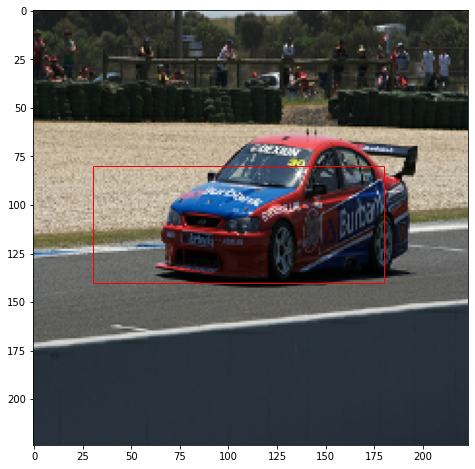

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


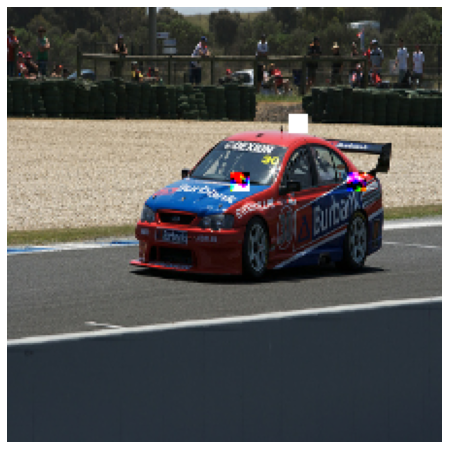

1/1 [==============================] - 0s 63ms/step
[[('n04037443', 'racer', 0.45643297), ('n02930766', 'cab', 0.26282927), ('n04285008', 'sports_car', 0.06711203), ('n02701002', 'ambulance', 0.015540995), ('n03444034', 'go-kart', 0.0120947305)]]
1/1 [==============================] - 4s 4s/step
[[('n02948072', 'candle', 0.516256), ('n04456115', 'torch', 0.10589668), ('n04037443', 'racer', 0.014994848), ('n04285008', 'sports_car', 0.007875748), ('n03670208', 'limousine', 0.006205783)]]
1/1 [==============================] - 3s 3s/step
[[('n04037443', 'racer', 0.9776583), ('n04285008', 'sports_car', 0.017396858), ('n02930766', 'cab', 0.0022816078), ('n04461696', 'tow_truck', 0.0007753516), ('n03444034', 'go-kart', 0.00057888735)]]


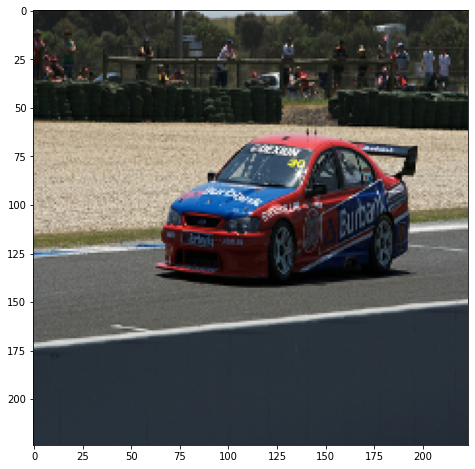

1/1 [==============================] - 0s 74ms/step
[[('n04037443', 'racer', 0.76507366), ('n04285008', 'sports_car', 0.05463958), ('n02930766', 'cab', 0.040202115), ('n03895866', 'passenger_car', 0.011915082), ('n03444034', 'go-kart', 0.009591402)]]
1/1 [==============================] - 0s 87ms/step
[[('n04037443', 'racer', 0.7967267), ('n04285008', 'sports_car', 0.062329873), ('n02974003', 'car_wheel', 0.016285224), ('n03895866', 'passenger_car', 0.014716473), ('n02930766', 'cab', 0.011689738)]]
1/1 [==============================] - 0s 177ms/step
[[('n04037443', 'racer', 0.9864544), ('n04285008', 'sports_car', 0.010833616), ('n03444034', 'go-kart', 0.0009612173), ('n02930766', 'cab', 0.0006212374), ('n02974003', 'car_wheel', 0.00038245306)]]
1/1 [==============================] - 0s 175ms/step


In [52]:
#All this stuff gets changed for each image
real_label_index = 751 #Car
Obj = 'Car'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_racer.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, sep='\t')

# Cup - new Guitar


1/1 [==============================] - 0s 62ms/step


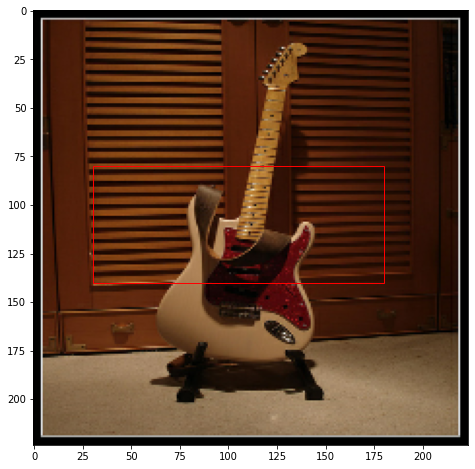

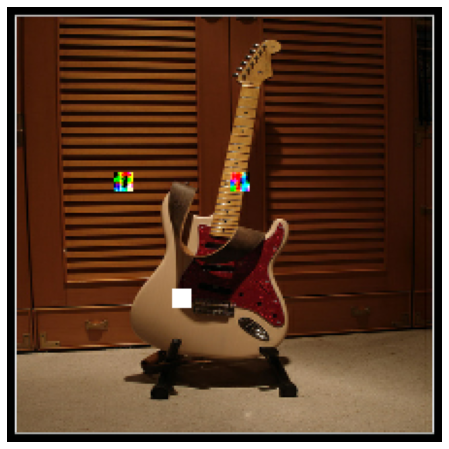

1/1 [==============================] - 0s 42ms/step
[[('n03272010', 'electric_guitar', 0.8748258), ('n03495258', 'harp', 0.047923174), ('n02676566', 'acoustic_guitar', 0.01071542), ('n04517823', 'vacuum', 0.002856891), ('n02787622', 'banjo', 0.002429198)]]
1/1 [==============================] - 0s 90ms/step
[[('n04009552', 'projector', 0.35243392), ('n04286575', 'spotlight', 0.24026607), ('n01704323', 'triceratops', 0.030890752), ('n04456115', 'torch', 0.026332004), ('n02948072', 'candle', 0.021158623)]]
1/1 [==============================] - 0s 165ms/step
[[('n03272010', 'electric_guitar', 0.97846234), ('n02676566', 'acoustic_guitar', 0.007798564), ('n04517823', 'vacuum', 0.0026843254), ('n03791053', 'motor_scooter', 0.0019450688), ('n03785016', 'moped', 0.00137938)]]


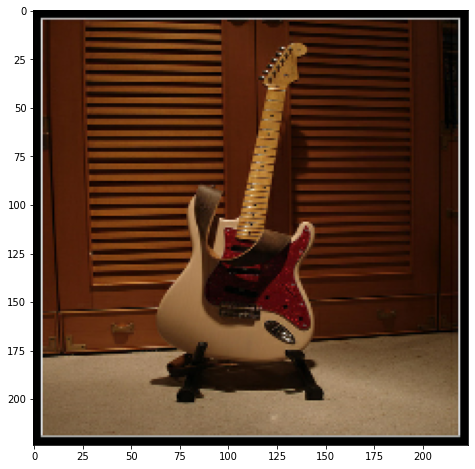

1/1 [==============================] - 0s 48ms/step
[[('n03272010', 'electric_guitar', 0.891347), ('n03495258', 'harp', 0.032631535), ('n02676566', 'acoustic_guitar', 0.010943813), ('n04517823', 'vacuum', 0.0021084924), ('n02787622', 'banjo', 0.0019988106)]]
1/1 [==============================] - 0s 77ms/step
[[('n03272010', 'electric_guitar', 0.9467073), ('n04296562', 'stage', 0.0063861557), ('n02676566', 'acoustic_guitar', 0.0035148503), ('n03929660', 'pick', 0.0014539537), ('n02326432', 'hare', 0.000609366)]]
1/1 [==============================] - 0s 164ms/step
[[('n03272010', 'electric_guitar', 0.98162353), ('n02676566', 'acoustic_guitar', 0.014975238), ('n02787622', 'banjo', 0.0010781451), ('n02672831', 'accordion', 0.00030814845), ('n03785016', 'moped', 0.0001990338)]]
1/1 [==============================] - 0s 166ms/step


In [53]:
#All this stuff gets changed for each image
real_label_index = 968 #Cup
Obj = 'Cup'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_guitar.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Frog

1/1 [==============================] - 0s 44ms/step


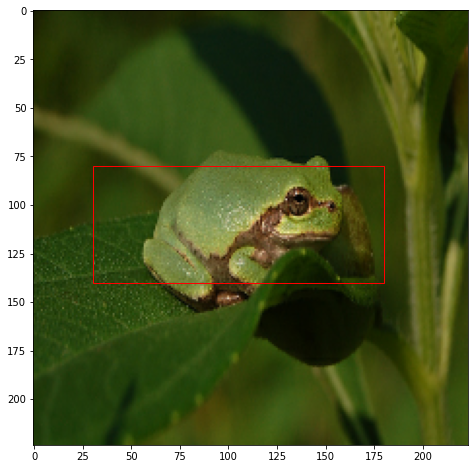

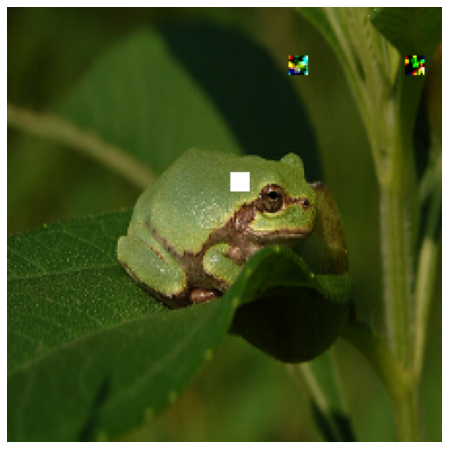

1/1 [==============================] - 0s 97ms/step
[[('n01644373', 'tree_frog', 0.9370356), ('n01644900', 'tailed_frog', 0.0298995), ('n01641577', 'bullfrog', 0.0033203517), ('n01729977', 'green_snake', 0.0009933251), ('n01675722', 'banded_gecko', 0.00041650966)]]
1/1 [==============================] - 0s 173ms/step
[[('n03729826', 'matchstick', 0.5093474), ('n02948072', 'candle', 0.37374446), ('n04456115', 'torch', 0.028232396), ('n03666591', 'lighter', 0.006481393), ('n04286575', 'spotlight', 0.0041521634)]]
1/1 [==============================] - 0s 274ms/step
[[('n01644373', 'tree_frog', 0.94359887), ('n01644900', 'tailed_frog', 0.033268698), ('n01641577', 'bullfrog', 0.019312449), ('n01694178', 'African_chameleon', 0.0014106205), ('n02169497', 'leaf_beetle', 0.0010763598)]]


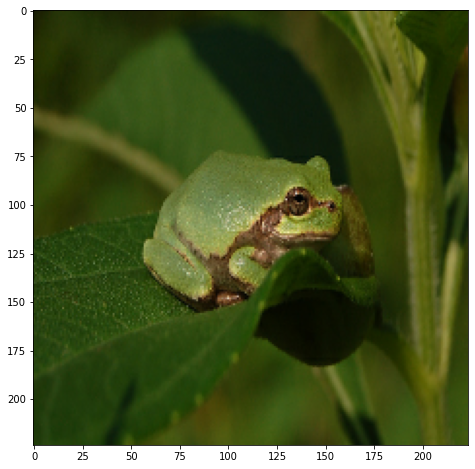

1/1 [==============================] - 0s 54ms/step
[[('n01644373', 'tree_frog', 0.95285344), ('n01644900', 'tailed_frog', 0.030560523), ('n01641577', 'bullfrog', 0.0006629908), ('n01729977', 'green_snake', 0.00034826915), ('n01675722', 'banded_gecko', 0.00024572152)]]
1/1 [==============================] - 0s 100ms/step
[[('n01644373', 'tree_frog', 0.89802617), ('n01644900', 'tailed_frog', 0.03952293), ('n01641577', 'bullfrog', 0.0017970203), ('n02177972', 'weevil', 0.0005989059), ('n02169497', 'leaf_beetle', 0.0005031212)]]
1/1 [==============================] - 0s 294ms/step
[[('n01644373', 'tree_frog', 0.95677215), ('n01644900', 'tailed_frog', 0.03953977), ('n01641577', 'bullfrog', 0.0022172239), ('n02169497', 'leaf_beetle', 0.0003507639), ('n01694178', 'African_chameleon', 0.00026491244)]]
1/1 [==============================] - 0s 229ms/step


In [54]:
#All this stuff gets changed for each image
real_label_index = 31 #Frog
Obj = 'Frog'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_frog.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Plate - new Beer

1/1 [==============================] - 0s 43ms/step


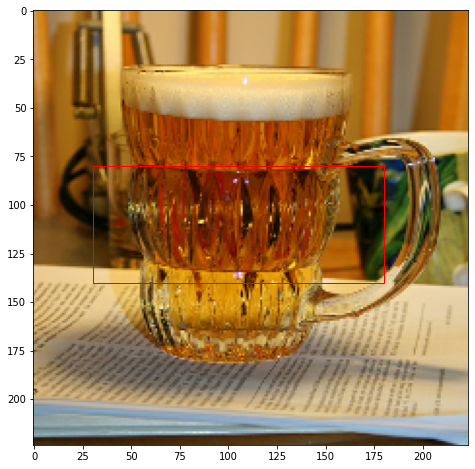

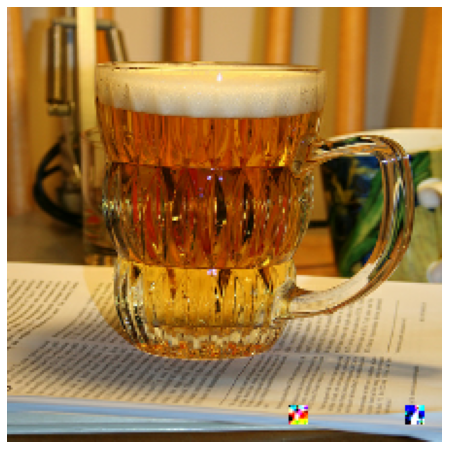

1/1 [==============================] - 0s 62ms/step
[[('n02823750', 'beer_glass', 0.38769257), ('n07930864', 'cup', 0.23957454), ('n03063599', 'coffee_mug', 0.18532105), ('n07920052', 'espresso', 0.03693346), ('n03733805', 'measuring_cup', 0.01810073)]]
1/1 [==============================] - 0s 80ms/step
[[('n02823750', 'beer_glass', 0.71879524), ('n07930864', 'cup', 0.0762361), ('n03443371', 'goblet', 0.026766911), ('n03063599', 'coffee_mug', 0.024908127), ('n07932039', 'eggnog', 0.020264141)]]
1/1 [==============================] - 0s 155ms/step
[[('n02823750', 'beer_glass', 0.3522695), ('n07930864', 'cup', 0.26270655), ('n07920052', 'espresso', 0.16932406), ('n03063599', 'coffee_mug', 0.09786248), ('n03443371', 'goblet', 0.024741696)]]


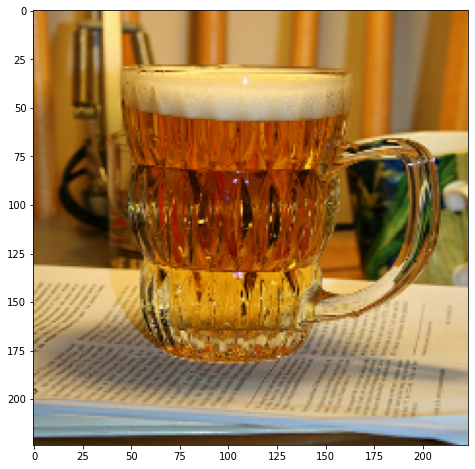

1/1 [==============================] - 0s 57ms/step
[[('n02823750', 'beer_glass', 0.44421172), ('n03063599', 'coffee_mug', 0.19888404), ('n07930864', 'cup', 0.1632363), ('n07920052', 'espresso', 0.030418493), ('n03733805', 'measuring_cup', 0.02110881)]]
1/1 [==============================] - 0s 87ms/step
[[('n02823750', 'beer_glass', 0.72791636), ('n07930864', 'cup', 0.06563235), ('n03443371', 'goblet', 0.029852325), ('n03063599', 'coffee_mug', 0.02242909), ('n07932039', 'eggnog', 0.01681306)]]
1/1 [==============================] - 0s 170ms/step
[[('n02823750', 'beer_glass', 0.42565462), ('n07930864', 'cup', 0.22690171), ('n07920052', 'espresso', 0.21174066), ('n03063599', 'coffee_mug', 0.06633741), ('n03443371', 'goblet', 0.009324722)]]
1/1 [==============================] - 0s 160ms/step


In [55]:
#All this stuff gets changed for each image
real_label_index = 923 #Plate
Obj = 'Plate'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_beer.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Tank

1/1 [==============================] - 0s 58ms/step


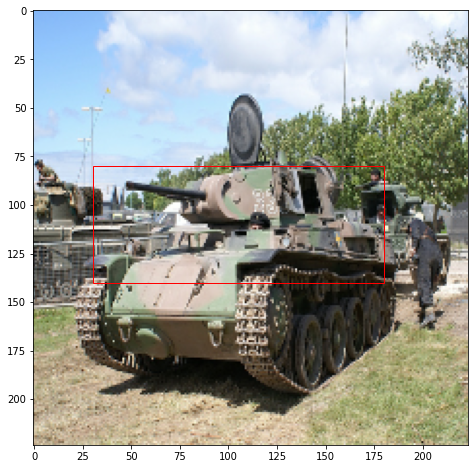

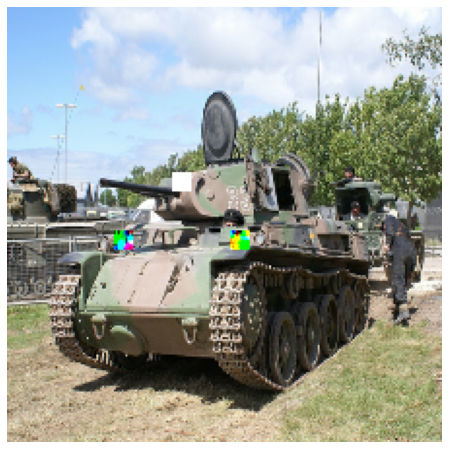

1/1 [==============================] - 0s 61ms/step
[[('n04389033', 'tank', 0.9362618), ('n03478589', 'half_track', 0.0067247716), ('n02704792', 'amphibian', 0.0018577403), ('n04008634', 'projectile', 0.0012638003), ('n03763968', 'military_uniform', 0.0010983354)]]
1/1 [==============================] - 0s 81ms/step
[[('n02704792', 'amphibian', 0.52281433), ('n04389033', 'tank', 0.40460148), ('n03478589', 'half_track', 0.0064760623), ('n02950826', 'cannon', 0.0022075959), ('n04008634', 'projectile', 0.0010025721)]]
1/1 [==============================] - 0s 182ms/step
[[('n04389033', 'tank', 0.9950852), ('n03478589', 'half_track', 0.0040448285), ('n02704792', 'amphibian', 0.00058075716), ('n03763968', 'military_uniform', 0.00017806413), ('n04008634', 'projectile', 5.5853456e-05)]]


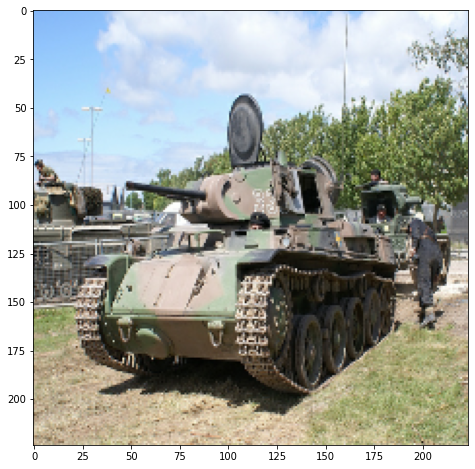

1/1 [==============================] - 0s 78ms/step
[[('n04389033', 'tank', 0.92397404), ('n03478589', 'half_track', 0.008521737), ('n02704792', 'amphibian', 0.0017730151), ('n04008634', 'projectile', 0.0012259264), ('n03763968', 'military_uniform', 0.0012142323)]]
1/1 [==============================] - 0s 77ms/step
[[('n04389033', 'tank', 0.8873127), ('n02704792', 'amphibian', 0.0085145915), ('n02950826', 'cannon', 0.004012518), ('n03478589', 'half_track', 0.0029340188), ('n04008634', 'projectile', 0.0010994022)]]
1/1 [==============================] - 0s 171ms/step
[[('n04389033', 'tank', 0.9999312), ('n03478589', 'half_track', 4.641454e-05), ('n02704792', 'amphibian', 2.0611891e-05), ('n02950826', 'cannon', 8.0192467e-07), ('n03763968', 'military_uniform', 3.7961678e-07)]]
1/1 [==============================] - 0s 163ms/step


In [56]:
#All this stuff gets changed for each image
real_label_index = 847 #Tank
Obj = 'Tank'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_tank.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Ship

1/1 [==============================] - 0s 46ms/step


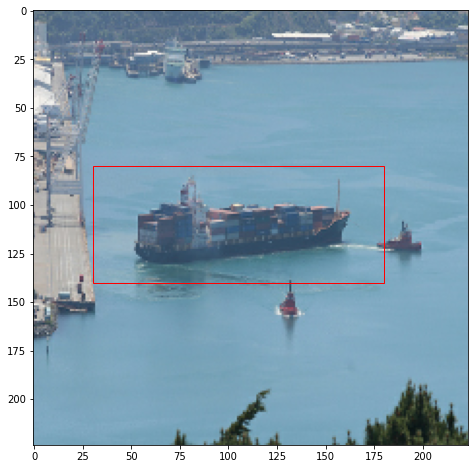

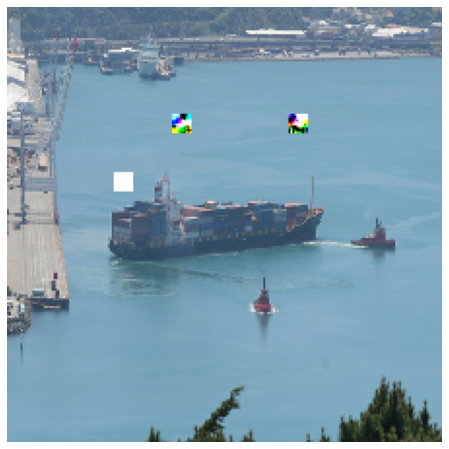

1/1 [==============================] - 0s 50ms/step
[[('n03216828', 'dock', 0.2572375), ('n03095699', 'container_ship', 0.2105653), ('n03947888', 'pirate', 0.1428785), ('n04606251', 'wreck', 0.06141666), ('n03673027', 'liner', 0.039580822)]]
1/1 [==============================] - 0s 79ms/step
[[('n02782093', 'balloon', 0.37192607), ('n04286575', 'spotlight', 0.120008945), ('n04456115', 'torch', 0.027790807), ('n06874185', 'traffic_light', 0.024913488), ('n02948072', 'candle', 0.020204287)]]
1/1 [==============================] - 0s 154ms/step
[[('n03095699', 'container_ship', 0.5839587), ('n04606251', 'wreck', 0.08439578), ('n03673027', 'liner', 0.07686317), ('n03947888', 'pirate', 0.07656862), ('n03216828', 'dock', 0.048406728)]]


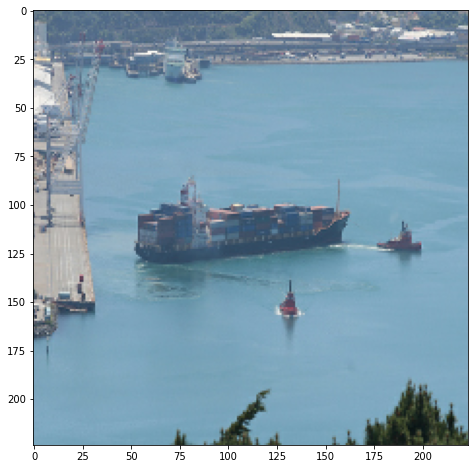

1/1 [==============================] - 0s 64ms/step
[[('n03095699', 'container_ship', 0.7822373), ('n03216828', 'dock', 0.04854241), ('n03673027', 'liner', 0.024140744), ('n04606251', 'wreck', 0.023428936), ('n03662601', 'lifeboat', 0.02036577)]]
1/1 [==============================] - 0s 84ms/step
[[('n03095699', 'container_ship', 0.91552174), ('n03216828', 'dock', 0.011323597), ('n03240683', 'drilling_platform', 0.0044742813), ('n03673027', 'liner', 0.003332697), ('n03126707', 'crane', 0.0027345777)]]
1/1 [==============================] - 0s 158ms/step
[[('n03095699', 'container_ship', 0.8569311), ('n03240683', 'drilling_platform', 0.06213689), ('n03673027', 'liner', 0.027860159), ('n03216828', 'dock', 0.010862852), ('n03947888', 'pirate', 0.010721195)]]
1/1 [==============================] - 0s 154ms/step


In [57]:
#All this stuff gets changed for each image
real_label_index = 814 #Speedboat
Obj = 'Boat'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_ship.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Bagel

1/1 [==============================] - 0s 42ms/step


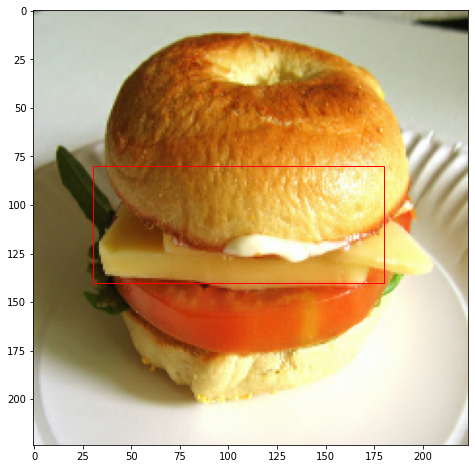

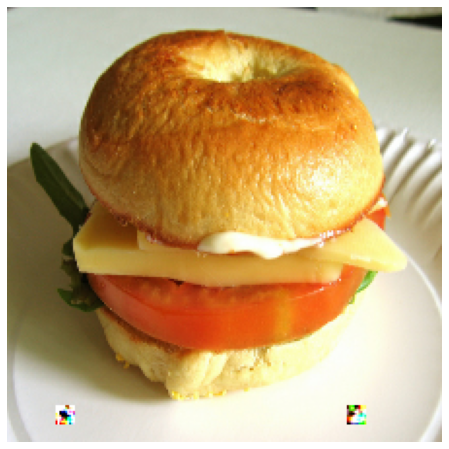

1/1 [==============================] - 0s 80ms/step
[[('n07697313', 'cheeseburger', 0.50746053), ('n07693725', 'bagel', 0.31558922), ('n07684084', 'French_loaf', 0.026076866), ('n07875152', 'potpie', 0.0071284943), ('n07697537', 'hotdog', 0.0052204984)]]
1/1 [==============================] - 0s 85ms/step
[[('n07693725', 'bagel', 0.85703456), ('n07697313', 'cheeseburger', 0.09119306), ('n07684084', 'French_loaf', 0.0049992236), ('n02776631', 'bakery', 0.0018242011), ('n07697537', 'hotdog', 0.0010997014)]]
1/1 [==============================] - 0s 177ms/step
[[('n07693725', 'bagel', 0.93618804), ('n07697313', 'cheeseburger', 0.062706515), ('n07875152', 'potpie', 0.00031497004), ('n02776631', 'bakery', 0.0001918326), ('n07684084', 'French_loaf', 0.000103073624)]]


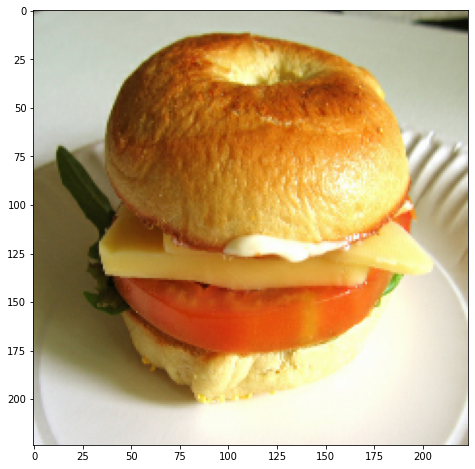

1/1 [==============================] - 0s 54ms/step
[[('n07693725', 'bagel', 0.50637615), ('n07697313', 'cheeseburger', 0.37169257), ('n07684084', 'French_loaf', 0.011984711), ('n07697537', 'hotdog', 0.00489973), ('n07875152', 'potpie', 0.0038561418)]]
1/1 [==============================] - 0s 104ms/step
[[('n07693725', 'bagel', 0.9131308), ('n07697313', 'cheeseburger', 0.05641743), ('n07684084', 'French_loaf', 0.001453761), ('n02776631', 'bakery', 0.0012067249), ('n07697537', 'hotdog', 0.00056719885)]]
1/1 [==============================] - 0s 169ms/step
[[('n07693725', 'bagel', 0.9871523), ('n07697313', 'cheeseburger', 0.012588514), ('n02776631', 'bakery', 9.395625e-05), ('n07875152', 'potpie', 4.044227e-05), ('n07747607', 'orange', 3.3915887e-05)]]
1/1 [==============================] - 0s 168ms/step


In [58]:
#All this stuff gets changed for each image
real_label_index = 933 #Cheeseburger
Obj = 'Sandwich'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_bagel.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Echidna

1/1 [==============================] - 0s 42ms/step


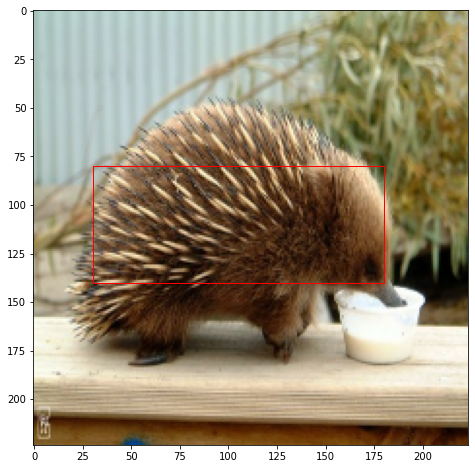

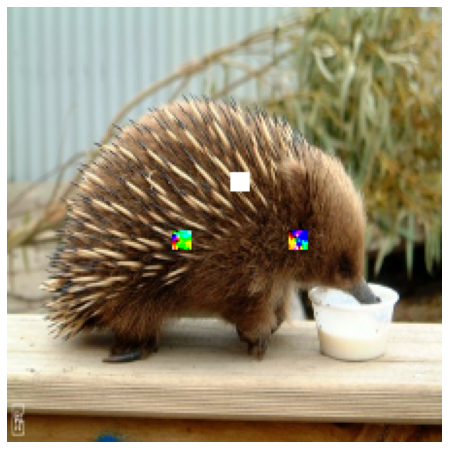

1/1 [==============================] - 0s 58ms/step
[[('n01872401', 'echidna', 0.8745452), ('n02346627', 'porcupine', 0.0039067976), ('n02443114', 'polecat', 0.002831245), ('n02442845', 'mink', 0.002170285), ('n07730033', 'cardoon', 0.0014462578)]]
1/1 [==============================] - 0s 80ms/step
[[('n02948072', 'candle', 0.9349884), ('n04456115', 'torch', 0.00857096), ('n04286575', 'spotlight', 0.0044870176), ('n03729826', 'matchstick', 0.00363455), ('n03666591', 'lighter', 0.0018374098)]]
1/1 [==============================] - 0s 178ms/step
[[('n01872401', 'echidna', 0.93410367), ('n02346627', 'porcupine', 0.044567376), ('n02906734', 'broom', 0.0019190174), ('n02442845', 'mink', 0.0018851738), ('n04033901', 'quill', 0.0012920414)]]


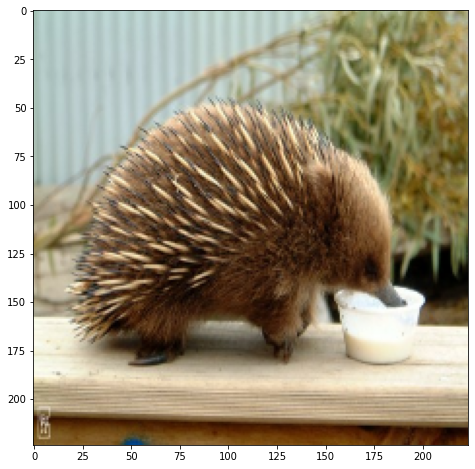

1/1 [==============================] - 0s 59ms/step
[[('n01872401', 'echidna', 0.95530665), ('n02346627', 'porcupine', 0.0011929193), ('n01873310', 'platypus', 0.0009499424), ('n02363005', 'beaver', 0.0005180177), ('n02443114', 'polecat', 0.00032831117)]]
1/1 [==============================] - 0s 87ms/step
[[('n01872401', 'echidna', 0.9141555), ('n02346627', 'porcupine', 0.0045611407), ('n04597913', 'wooden_spoon', 0.00082608446), ('n01873310', 'platypus', 0.0007676846), ('n02509815', 'lesser_panda', 0.0006948445)]]
1/1 [==============================] - 0s 165ms/step
[[('n01872401', 'echidna', 0.9986853), ('n02346627', 'porcupine', 0.00065254874), ('n02013706', 'limpkin', 7.0469345e-05), ('n12768682', 'buckeye', 6.915065e-05), ('n07730033', 'cardoon', 4.499551e-05)]]
1/1 [==============================] - 0s 157ms/step


In [59]:
#All this stuff gets changed for each image
real_label_index = 97 #Drake
Obj = 'Duck'
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_echidna.JPEG")

#Region to exclude
x_excl = 30
x_len = 150
y_excl = 80
y_len = 60

model = mobilenetv2
x_value = []
y_value = []
conf_results = []
imgclassmobilenetpet = []
predsmobilenetpet = []
imgclassnasnetpet = []
predsnasnetpet = []
imgclassdensenetpet = []
predsdensenetpet = []
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
imgclassdensenet = []
predsdensenet = []

#image path
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

adv_dar(image)
include = [1]*len(x_value)
create_adv_dars_auto()

#Save results
g = gen_mod_results()
g.to_csv('/content/gdrive/MyDrive/Data/DAR_data/cleanresultsuap.csv', index=True, mode='a', sep='\t')
d = gen_mod_results_pet()
d.to_csv('/content/gdrive/MyDrive/Data/DAR_data/petresultsuap.csv', index=True, mode='a', sep='\t')

# Testing other images

In [ ]:
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_racer.JPEG")
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

  #Save results for clean images
  #Mobilenet
image_probs_mobilenet = mobilenetv2.predict(image)
_, image_class, class_confidence = get_imagenet_label(image_probs_mobilenet)
print(image_class, class_confidence)

  #Nasnet
image_probs_nasnet = nasnet.predict(image)
_, image_class, class_confidence = get_imagenet_label(image_probs_nasnet)
print(image_class, class_confidence)

  #Densenet
image_probs_densenet = densenet.predict(image)
_, image_class, class_confidence = get_imagenet_label(image_probs_densenet)
print(image_class, class_confidence)



1/1 [==============================] - 0s 59ms/step
racer 0.7650741
1/1 [==============================] - 0s 122ms/step
racer 0.79672706
1/1 [==============================] - 0s 264ms/step
racer 0.9864544


In [ ]:
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_ship.JPEG")
im1 = tf.image.decode_image(im1_raw)
image = preprocess(im1)

  #Save results for clean images
  #Mobilenet
image_probs_mobilenet = mobilenetv2.predict(image)
_, image_class, class_confidence = get_imagenet_label(image_probs_mobilenet)
print(image_class, class_confidence)

  #Nasnet
image_probs_nasnet = nasnet.predict(image)
_, image_class, class_confidence = get_imagenet_label(image_probs_nasnet)
print(image_class, class_confidence)

  #Densenet
image_probs_densenet = densenet.predict(image)
_, image_class, class_confidence = get_imagenet_label(image_probs_densenet)
print(image_class, class_confidence)

# Display image grids

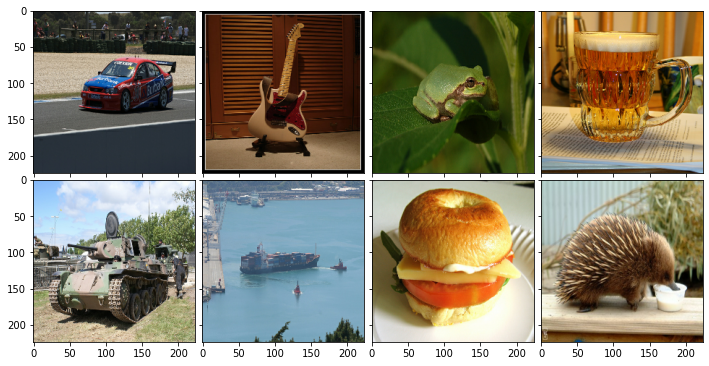

In [ ]:
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_racer.JPEG")
im1 = tf.image.decode_image(im1_raw)
im1 = preprocess(im1)

im2_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_guitar.JPEG")
im2 = tf.image.decode_image(im2_raw)
im2 = preprocess(im2)

im3_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_frog.JPEG")
im3 = tf.image.decode_image(im3_raw)
im3 = preprocess(im3)


im4_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_beer.JPEG")
im4 = tf.image.decode_image(im4_raw)
im4 = preprocess(im4)

im5_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_tank.JPEG")
im5 = tf.image.decode_image(im5_raw)
im5 = preprocess(im5)

im6_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_ship.JPEG")
im6 = tf.image.decode_image(im6_raw)
im6 = preprocess(im6)

im7_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_bagel.JPEG")
im7 = tf.image.decode_image(im7_raw)
im7 = preprocess(im7)

im8_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/imagenet_echidna.JPEG")
im8 = tf.image.decode_image(im8_raw)
im8 = preprocess(im8)


fig = plt.figure(figsize=(12., 12.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 4),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, [im1, im2, im3, im4, im5, im6, im7, im8]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]

plt.savefig("/content/gdrive/MyDrive/Data/DAR_data/cleanimages.png")
plt.show()

Display clean images - original

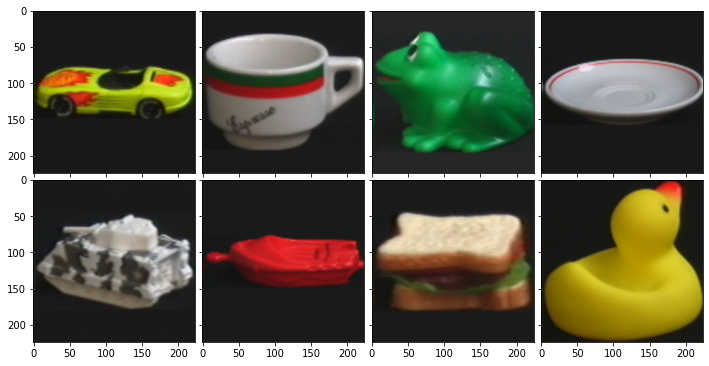

In [ ]:
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_1/obj6__10.png")
im1 = tf.image.decode_image(im1_raw)
im1 = preprocess(im1)

im2_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_2/obj10__0.png")
im2 = tf.image.decode_image(im2_raw)
im2 = preprocess(im2)

im3_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_3/obj28__0.png")
im3 = tf.image.decode_image(im3_raw)
im3 = preprocess(im3)


im4_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_4/obj35__0.png")
im4 = tf.image.decode_image(im4_raw)
im4 = preprocess(im4)

im5_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_5/obj37__35.png")
im5 = tf.image.decode_image(im5_raw)
im5 = preprocess(im5)

im6_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_6/obj38__0.png")
im6 = tf.image.decode_image(im6_raw)
im6 = preprocess(im6)

im7_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_7/obj53__0.png")
im7 = tf.image.decode_image(im7_raw)
im7 = preprocess(im7)

im8_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_8/obj74__130.png")
im8 = tf.image.decode_image(im8_raw)
im8 = preprocess(im8)


fig = plt.figure(figsize=(12., 12.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 4),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, [im1, im2, im3, im4, im5, im6, im7, im8]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]

plt.savefig("/content/gdrive/MyDrive/Data/DAR_data/cleanimages.png")
plt.show()

Display perturbed images

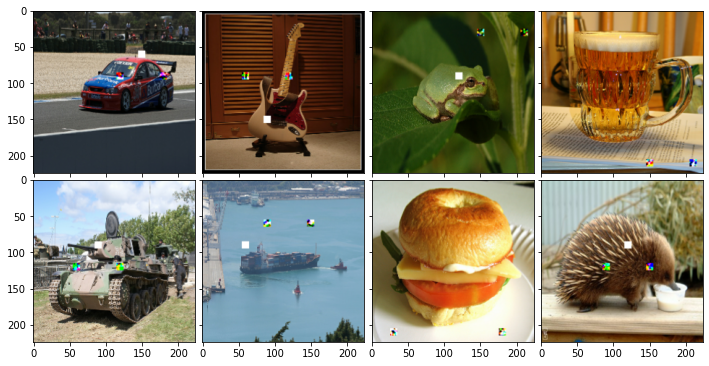

In [60]:
im1_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Car_DARS_3_UAP.png")
im1 = tf.image.decode_image(im1_raw)
im1 = preprocess(im1)

im2_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Cup_DARS_3_UAP.png")
im2 = tf.image.decode_image(im2_raw)
im2 = preprocess(im2)

im3_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Frog_DARS_3_UAP.png")
im3 = tf.image.decode_image(im3_raw)
im3 = preprocess(im3)

im4_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Plate_DARS_3_UAP.png")
im4 = tf.image.decode_image(im4_raw)
im4 = preprocess(im4)

im5_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Tank_DARS_3_UAP.png")
im5 = tf.image.decode_image(im5_raw)
im5 = preprocess(im5)

im6_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Boat_DARS_3_UAP.png")
im6 = tf.image.decode_image(im6_raw)
im6 = preprocess(im6)

im7_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Sandwich_DARS_3_UAP.png")
im7 = tf.image.decode_image(im7_raw)
im7 = preprocess(im7)

im8_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Pet_Duck_DARS_3_UAP.png")
im8 = tf.image.decode_image(im8_raw)
im8 = preprocess(im8)


fig = plt.figure(figsize=(12., 12.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 4),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, [im1, im2, im3, im4, im5, im6, im7, im8]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]

plt.savefig("/content/gdrive/MyDrive/Data/DAR_data/petimagesuap.png")
plt.show()

## Generate perturbed images

Object 1 - car

  0%|          | 0/9 [00:00<?, ?it/s]

1/1 [==============================] - 0s 62ms/step
[[('n04037443', 'racer', 0.36919567), ('n03649909', 'lawn_mower', 0.059652936), ('n04285008', 'sports_car', 0.059129782), ('n02930766', 'cab', 0.01916896), ('n03720891', 'maraca', 0.0150401)]]
1/1 [==============================] - 0s 137ms/step


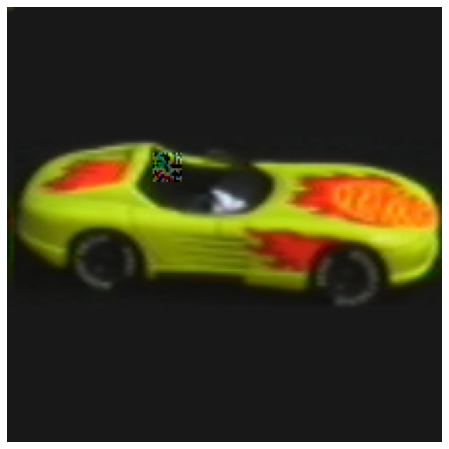

 11%|█         | 1/9 [00:03<00:25,  3.15s/it]

1/1 [==============================] - 0s 62ms/step
[[('n04037443', 'racer', 0.26757273), ('n04285008', 'sports_car', 0.25835222), ('n02930766', 'cab', 0.13697952), ('n02974003', 'car_wheel', 0.06615864), ('n04579432', 'whistle', 0.019850023)]]
1/1 [==============================] - 0s 132ms/step


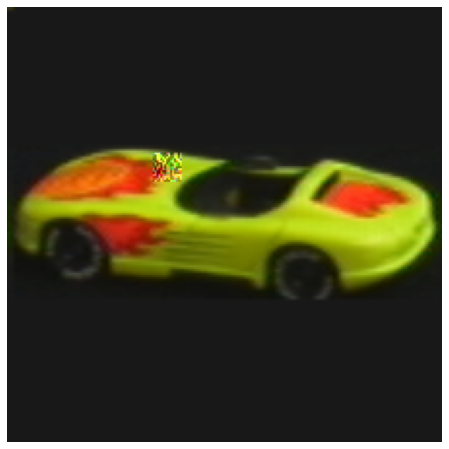

 22%|██▏       | 2/9 [00:06<00:22,  3.16s/it]

1/1 [==============================] - 0s 60ms/step
[[('n04037443', 'racer', 0.12365961), ('n04285008', 'sports_car', 0.11934237), ('n02974003', 'car_wheel', 0.06783468), ('n04461696', 'tow_truck', 0.06286494), ('n04467665', 'trailer_truck', 0.06178645)]]
1/1 [==============================] - 0s 128ms/step


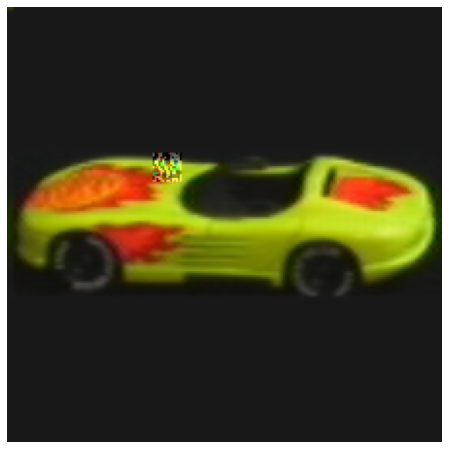

 33%|███▎      | 3/9 [00:09<00:18,  3.07s/it]

1/1 [==============================] - 0s 61ms/step
[[('n03794056', 'mousetrap', 0.65592766), ('n02840245', 'binder', 0.013980803), ('n03793489', 'mouse', 0.0128975855), ('n03047690', 'clog', 0.011483681), ('n03649909', 'lawn_mower', 0.01122237)]]
1/1 [==============================] - 0s 130ms/step


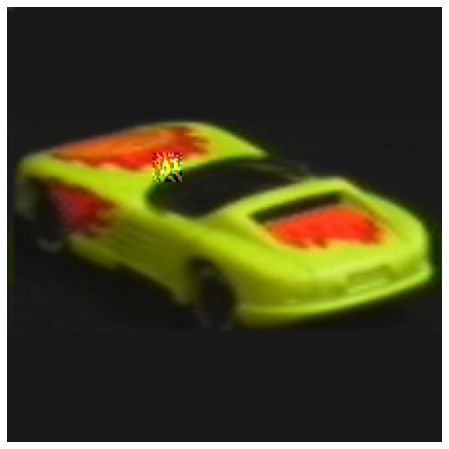

 44%|████▍     | 4/9 [00:12<00:15,  3.09s/it]

1/1 [==============================] - 0s 74ms/step
[[('n04579432', 'whistle', 0.15704302), ('n03047690', 'clog', 0.1019939), ('n03929660', 'pick', 0.059808183), ('n03197337', 'digital_watch', 0.029765712), ('n07584110', 'consomme', 0.02434956)]]
1/1 [==============================] - 0s 124ms/step


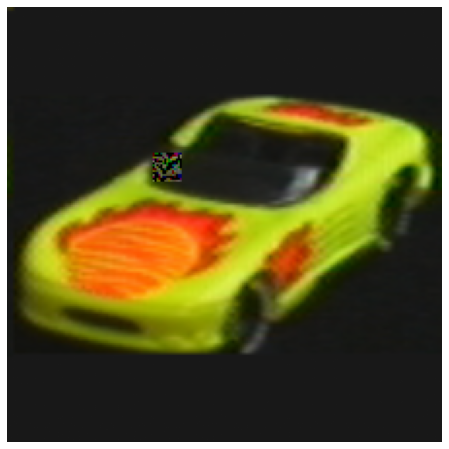

 56%|█████▌    | 5/9 [00:15<00:12,  3.15s/it]

1/1 [==============================] - 0s 64ms/step
[[('n03794056', 'mousetrap', 0.14785102), ('n03047690', 'clog', 0.084677406), ('n02930766', 'cab', 0.06189332), ('n04579432', 'whistle', 0.044347394), ('n03649909', 'lawn_mower', 0.024767553)]]
1/1 [==============================] - 0s 127ms/step


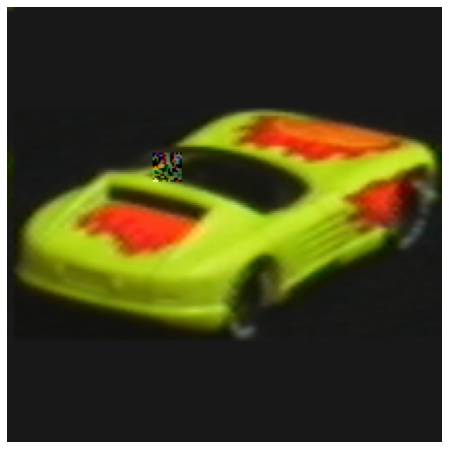

 67%|██████▋   | 6/9 [00:18<00:09,  3.19s/it]

1/1 [==============================] - 0s 62ms/step
[[('n04285008', 'sports_car', 0.2138217), ('n03047690', 'clog', 0.106154), ('n02930766', 'cab', 0.06451372), ('n04037443', 'racer', 0.03016357), ('n03649909', 'lawn_mower', 0.026734747)]]
1/1 [==============================] - 0s 156ms/step


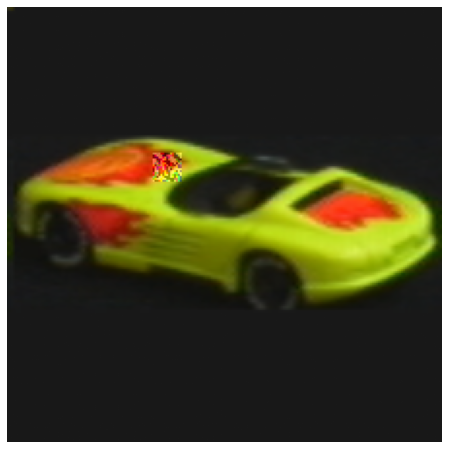

 78%|███████▊  | 7/9 [00:22<00:06,  3.21s/it]

1/1 [==============================] - 0s 64ms/step
[[('n03649909', 'lawn_mower', 0.22014809), ('n04037443', 'racer', 0.15790229), ('n04285008', 'sports_car', 0.05365307), ('n04039381', 'racket', 0.037340213), ('n03720891', 'maraca', 0.030975025)]]
1/1 [==============================] - 0s 153ms/step


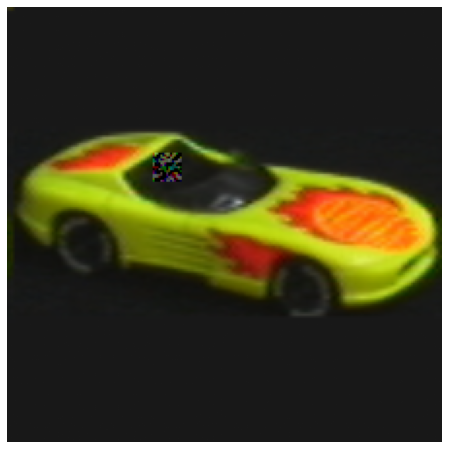

 89%|████████▉ | 8/9 [00:25<00:03,  3.18s/it]

1/1 [==============================] - 0s 63ms/step
[[('n04037443', 'racer', 0.16257644), ('n03649909', 'lawn_mower', 0.14797609), ('n04285008', 'sports_car', 0.12235284), ('n02930766', 'cab', 0.02055289), ('n04579432', 'whistle', 0.014634482)]]
1/1 [==============================] - 0s 130ms/step


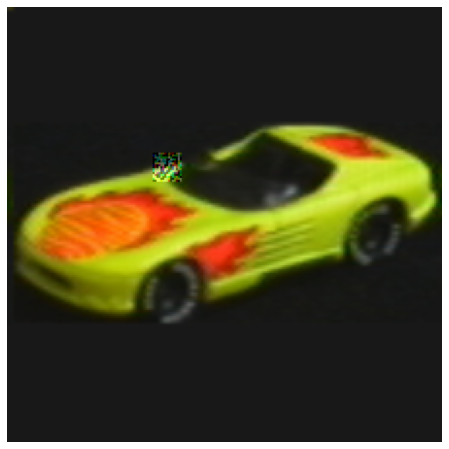

100%|██████████| 9/9 [00:28<00:00,  3.16s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_1")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_1/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(car)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/car.csv')

Image 2

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 65ms/step
[[('n03063599', 'coffee_mug', 0.8634441), ('n07930864', 'cup', 0.078091905), ('n07920052', 'espresso', 0.019090615), ('n04398044', 'teapot', 0.0017928022), ('n04263257', 'soup_bowl', 0.0015458488)]]
1/1 [==============================] - 0s 126ms/step


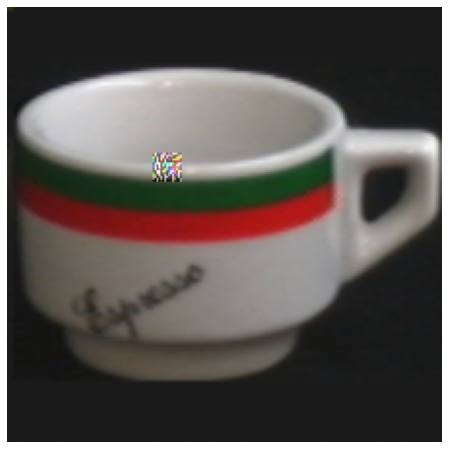

 12%|█▎        | 1/8 [00:02<00:19,  2.82s/it]

1/1 [==============================] - 0s 65ms/step
[[('n03063599', 'coffee_mug', 0.538145), ('n07930864', 'cup', 0.4073273), ('n07920052', 'espresso', 0.0072024907), ('n03733805', 'measuring_cup', 0.002732209), ('n07932039', 'eggnog', 0.002614629)]]
1/1 [==============================] - 0s 125ms/step


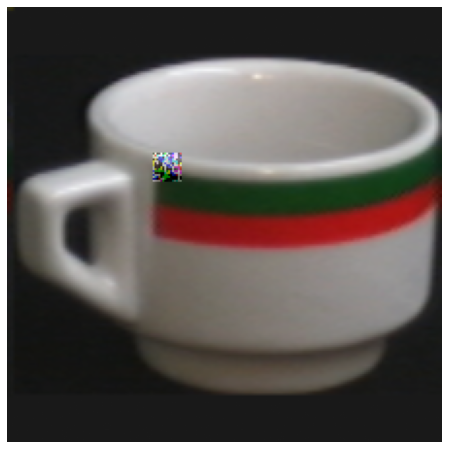

 25%|██▌       | 2/8 [00:06<00:19,  3.19s/it]

1/1 [==============================] - 0s 64ms/step
[[('n03063599', 'coffee_mug', 0.7185358), ('n07930864', 'cup', 0.22067891), ('n07920052', 'espresso', 0.0099012125), ('n03733805', 'measuring_cup', 0.0028308467), ('n03786901', 'mortar', 0.0027044527)]]
1/1 [==============================] - 0s 140ms/step


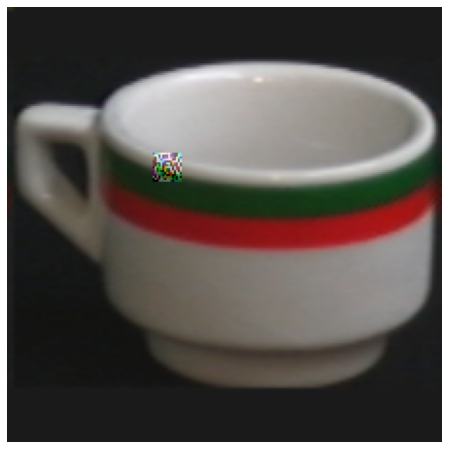

 38%|███▊      | 3/8 [00:09<00:15,  3.17s/it]

1/1 [==============================] - 0s 66ms/step
[[('n03063599', 'coffee_mug', 0.56661266), ('n07930864', 'cup', 0.106366396), ('n07920052', 'espresso', 0.017946882), ('n03314780', 'face_powder', 0.009859646), ('n03937543', 'pill_bottle', 0.009558038)]]
1/1 [==============================] - 0s 126ms/step


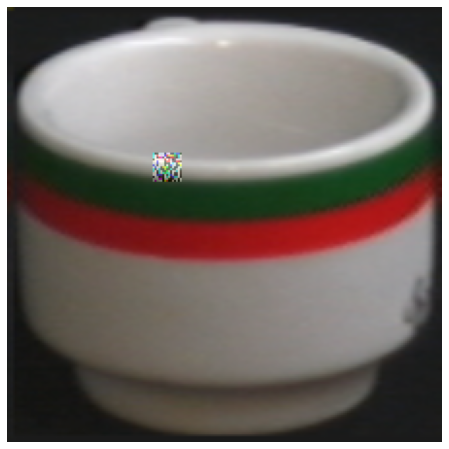

 50%|█████     | 4/8 [00:12<00:12,  3.16s/it]

1/1 [==============================] - 0s 68ms/step
[[('n03063599', 'coffee_mug', 0.59612507), ('n07930864', 'cup', 0.23045638), ('n07932039', 'eggnog', 0.007661485), ('n03786901', 'mortar', 0.0070912414), ('n04263257', 'soup_bowl', 0.0068812193)]]
1/1 [==============================] - 0s 128ms/step


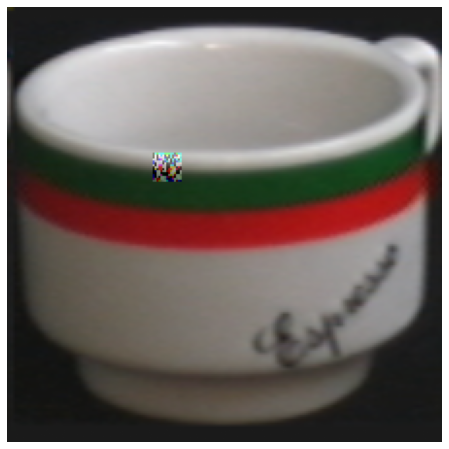

 62%|██████▎   | 5/8 [00:15<00:09,  3.20s/it]

1/1 [==============================] - 0s 124ms/step
[[('n03063599', 'coffee_mug', 0.8214078), ('n07930864', 'cup', 0.09791899), ('n07920052', 'espresso', 0.023544984), ('n04263257', 'soup_bowl', 0.0023353158), ('n04398044', 'teapot', 0.0020995436)]]
1/1 [==============================] - 0s 263ms/step


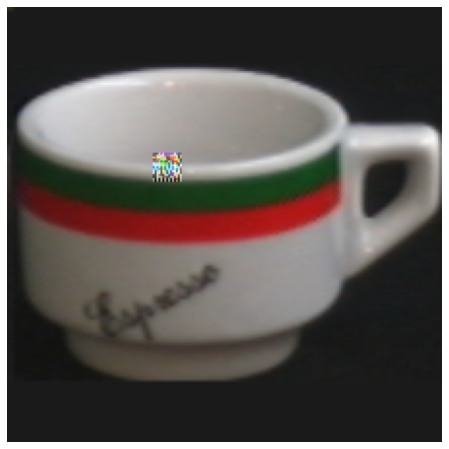

 75%|███████▌  | 6/8 [00:19<00:06,  3.47s/it]

1/1 [==============================] - 0s 74ms/step
[[('n03063599', 'coffee_mug', 0.86411357), ('n07930864', 'cup', 0.10215763), ('n07920052', 'espresso', 0.008647615), ('n03733805', 'measuring_cup', 0.00079403154), ('n07932039', 'eggnog', 0.00076851924)]]
1/1 [==============================] - 0s 139ms/step


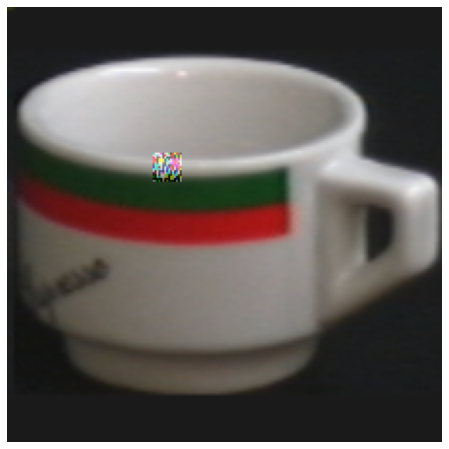

 88%|████████▊ | 7/8 [00:23<00:03,  3.57s/it]

1/1 [==============================] - 0s 64ms/step
[[('n03063599', 'coffee_mug', 0.6168039), ('n07930864', 'cup', 0.047372993), ('n03843555', 'oil_filter', 0.0429994), ('n03937543', 'pill_bottle', 0.02387931), ('n07920052', 'espresso', 0.020658057)]]
1/1 [==============================] - 0s 140ms/step


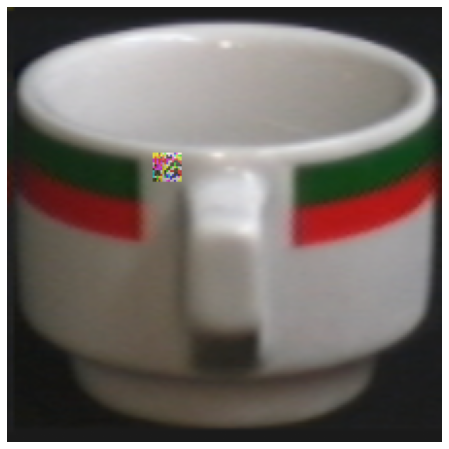

100%|██████████| 8/8 [00:26<00:00,  3.35s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_2")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_2/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(cup)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/cup.csv')

Image 3

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 66ms/step
[[('n01644373', 'tree_frog', 0.07503032), ('n03602883', 'joystick', 0.066294014), ('n03935335', 'piggy_bank', 0.053609222), ('n03908714', 'pencil_sharpener', 0.039371792), ('n03793489', 'mouse', 0.03331597)]]
1/1 [==============================] - 0s 130ms/step


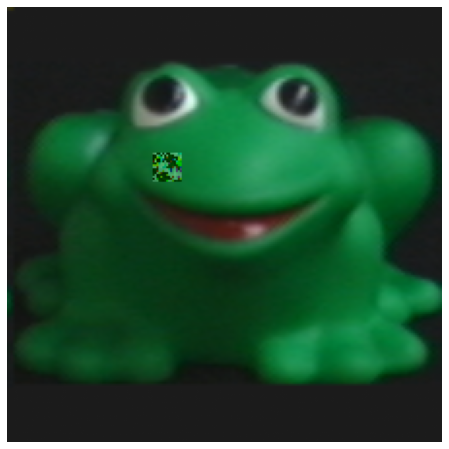

 12%|█▎        | 1/8 [00:03<00:22,  3.16s/it]

1/1 [==============================] - 0s 68ms/step
[[('n03935335', 'piggy_bank', 0.5645917), ('n04579432', 'whistle', 0.10180839), ('n03840681', 'ocarina', 0.038672943), ('n01496331', 'electric_ray', 0.020884277), ('n01484850', 'great_white_shark', 0.0073483493)]]
1/1 [==============================] - 0s 126ms/step


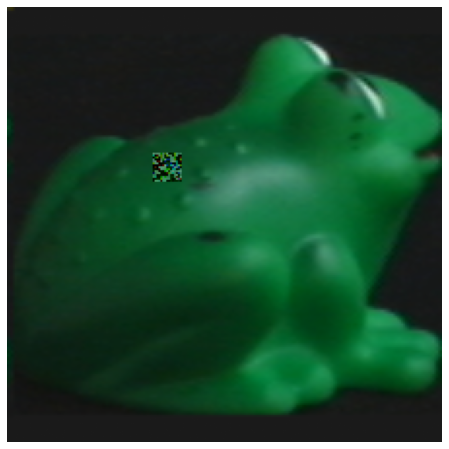

 25%|██▌       | 2/8 [00:06<00:19,  3.23s/it]

1/1 [==============================] - 0s 54ms/step
[[('n03935335', 'piggy_bank', 0.24600145), ('n07720875', 'bell_pepper', 0.16176021), ('n01496331', 'electric_ray', 0.036445264), ('n03840681', 'ocarina', 0.03275204), ('n07742313', 'Granny_Smith', 0.022144428)]]
1/1 [==============================] - 0s 129ms/step


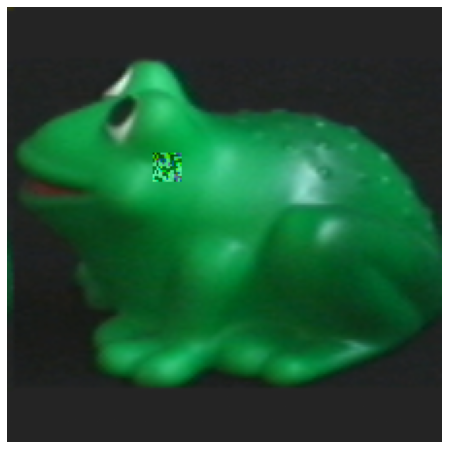

 38%|███▊      | 3/8 [00:09<00:15,  3.20s/it]

1/1 [==============================] - 0s 72ms/step
[[('n01496331', 'electric_ray', 0.13691178), ('n03935335', 'piggy_bank', 0.1071529), ('n07720875', 'bell_pepper', 0.074592456), ('n03840681', 'ocarina', 0.039699487), ('n01924916', 'flatworm', 0.03312722)]]
1/1 [==============================] - 0s 140ms/step


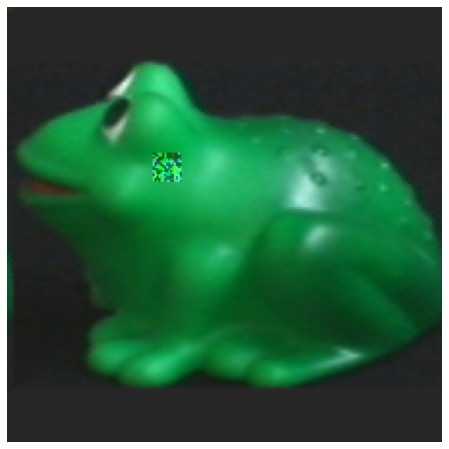

 50%|█████     | 4/8 [00:12<00:12,  3.15s/it]

1/1 [==============================] - 0s 62ms/step
[[('n03935335', 'piggy_bank', 0.27697796), ('n07720875', 'bell_pepper', 0.058242794), ('n03929660', 'pick', 0.026785322), ('n01749939', 'green_mamba', 0.020300359), ('n01739381', 'vine_snake', 0.018334871)]]
1/1 [==============================] - 0s 157ms/step


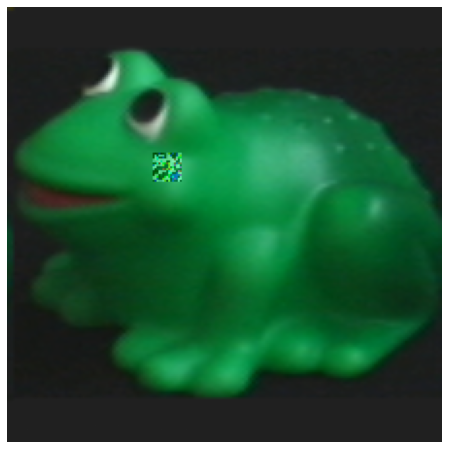

 62%|██████▎   | 5/8 [00:15<00:09,  3.15s/it]

1/1 [==============================] - 0s 61ms/step
[[('n07720875', 'bell_pepper', 0.20705111), ('n03825788', 'nipple', 0.089266784), ('n07718472', 'cucumber', 0.04725488), ('n01943899', 'conch', 0.027873082), ('n01644900', 'tailed_frog', 0.025137382)]]
1/1 [==============================] - 0s 129ms/step


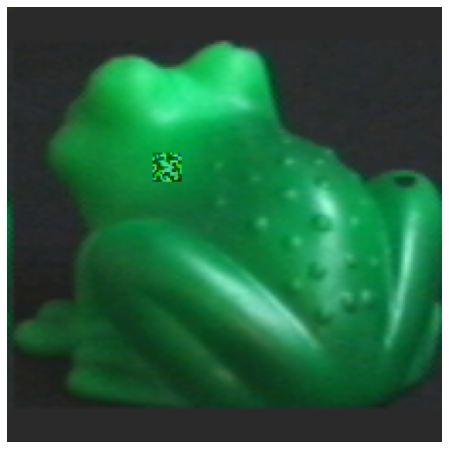

 75%|███████▌  | 6/8 [00:19<00:06,  3.20s/it]

1/1 [==============================] - 0s 69ms/step
[[('n03825788', 'nipple', 0.27845225), ('n07720875', 'bell_pepper', 0.20902897), ('n07718472', 'cucumber', 0.031885576), ('n03929660', 'pick', 0.024224637), ('n01950731', 'sea_slug', 0.021708272)]]
1/1 [==============================] - 0s 119ms/step


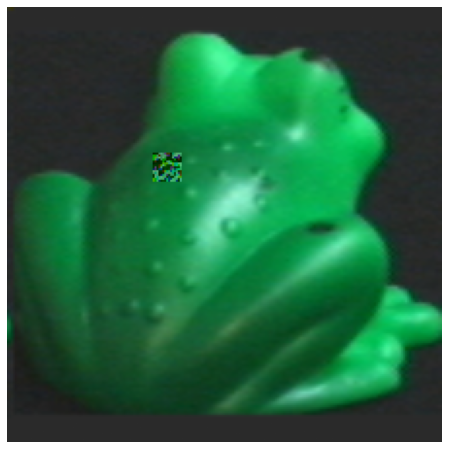

 88%|████████▊ | 7/8 [00:22<00:03,  3.17s/it]

1/1 [==============================] - 0s 64ms/step
[[('n03935335', 'piggy_bank', 0.14371784), ('n02606052', 'rock_beauty', 0.0403295), ('n03196217', 'digital_clock', 0.028486298), ('n03793489', 'mouse', 0.027616845), ('n04579432', 'whistle', 0.027499998)]]
1/1 [==============================] - 0s 124ms/step


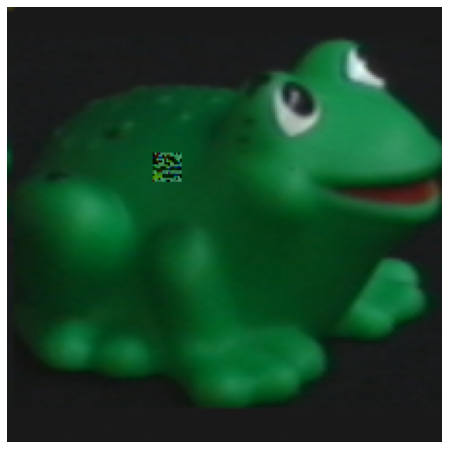

100%|██████████| 8/8 [00:25<00:00,  3.16s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_3")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_3/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(frog)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/frog.csv')

Image 4

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 64ms/step
[[('n07930864', 'cup', 0.3595059), ('n03063599', 'coffee_mug', 0.04921071), ('n03657121', 'lens_cap', 0.037691742), ('n03775546', 'mixing_bowl', 0.028070237), ('n03400231', 'frying_pan', 0.026767889)]]
1/1 [==============================] - 0s 118ms/step


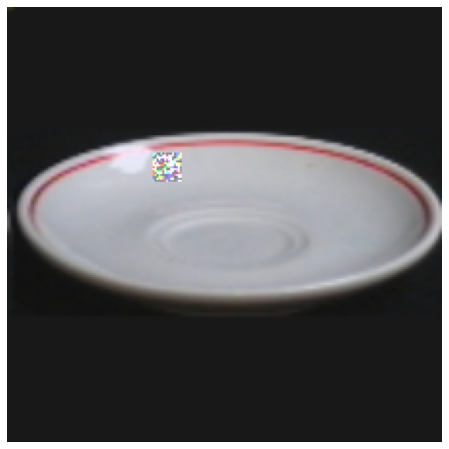

 12%|█▎        | 1/8 [00:02<00:20,  2.88s/it]

1/1 [==============================] - 0s 66ms/step
[[('n07930864', 'cup', 0.17936721), ('n03657121', 'lens_cap', 0.050879337), ('n03400231', 'frying_pan', 0.04583232), ('n03920288', 'Petri_dish', 0.039163318), ('n03775546', 'mixing_bowl', 0.036069427)]]
1/1 [==============================] - 0s 125ms/step


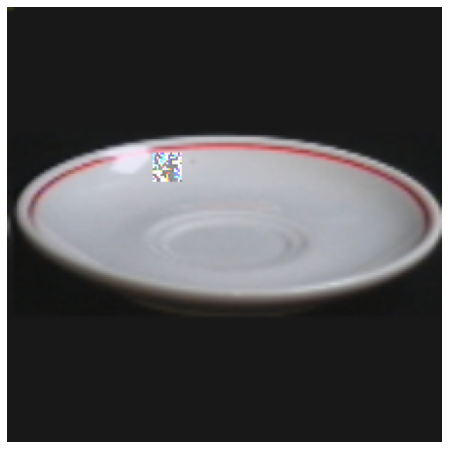

 25%|██▌       | 2/8 [00:05<00:17,  2.92s/it]

1/1 [==============================] - 0s 61ms/step
[[('n07930864', 'cup', 0.2828416), ('n04553703', 'washbasin', 0.068403944), ('n03400231', 'frying_pan', 0.054224048), ('n03775546', 'mixing_bowl', 0.032682937), ('n03657121', 'lens_cap', 0.0280784)]]
1/1 [==============================] - 0s 114ms/step


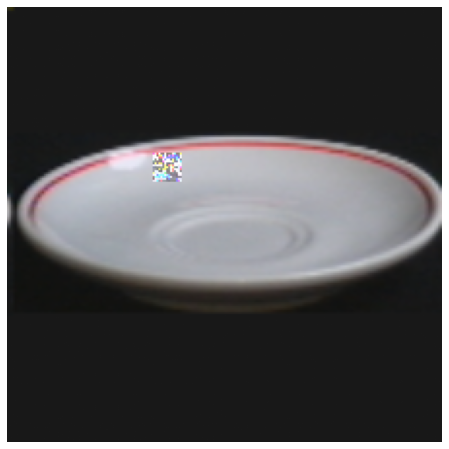

 38%|███▊      | 3/8 [00:08<00:14,  2.83s/it]

1/1 [==============================] - 0s 61ms/step
[[('n07930864', 'cup', 0.1705809), ('n03400231', 'frying_pan', 0.15258528), ('n04553703', 'washbasin', 0.04829241), ('n07579787', 'plate', 0.03405687), ('n03657121', 'lens_cap', 0.032610282)]]
1/1 [==============================] - 0s 115ms/step


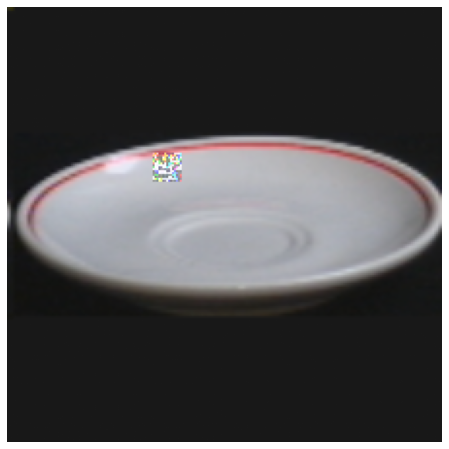

 50%|█████     | 4/8 [00:11<00:11,  2.85s/it]

1/1 [==============================] - 0s 58ms/step
[[('n07930864', 'cup', 0.21718857), ('n02988304', 'CD_player', 0.068604775), ('n03657121', 'lens_cap', 0.0594811), ('n07579787', 'plate', 0.038323924), ('n03063599', 'coffee_mug', 0.029532783)]]
1/1 [==============================] - 0s 128ms/step


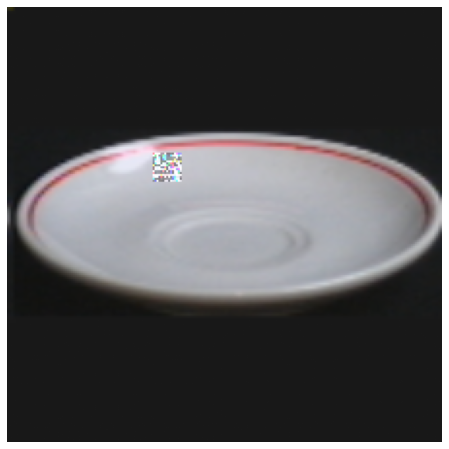

 62%|██████▎   | 5/8 [00:14<00:09,  3.04s/it]

1/1 [==============================] - 0s 53ms/step
[[('n07930864', 'cup', 0.16482867), ('n03400231', 'frying_pan', 0.12965639), ('n03657121', 'lens_cap', 0.04617993), ('n07579787', 'plate', 0.033614933), ('n04553703', 'washbasin', 0.027177805)]]
1/1 [==============================] - 0s 116ms/step


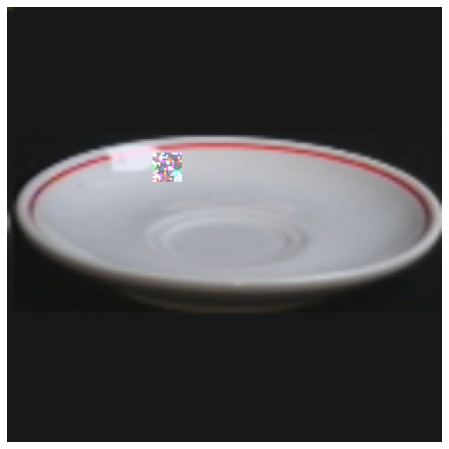

 75%|███████▌  | 6/8 [00:17<00:06,  3.03s/it]

1/1 [==============================] - 0s 57ms/step
[[('n07930864', 'cup', 0.13934714), ('n03400231', 'frying_pan', 0.06113635), ('n03657121', 'lens_cap', 0.05911089), ('n03775546', 'mixing_bowl', 0.04312039), ('n02988304', 'CD_player', 0.03722196)]]
1/1 [==============================] - 0s 129ms/step


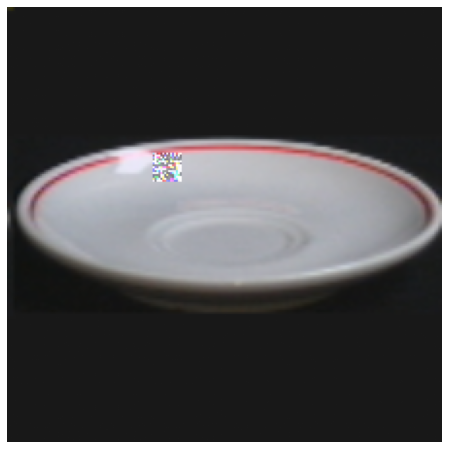

 88%|████████▊ | 7/8 [00:20<00:03,  3.01s/it]

1/1 [==============================] - 0s 55ms/step
[[('n03400231', 'frying_pan', 0.12200274), ('n03657121', 'lens_cap', 0.09861872), ('n07930864', 'cup', 0.07081231), ('n07579787', 'plate', 0.045016885), ('n04553703', 'washbasin', 0.035125364)]]
1/1 [==============================] - 0s 120ms/step


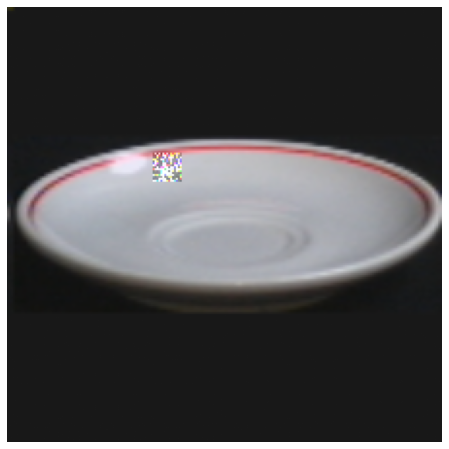

100%|██████████| 8/8 [00:23<00:00,  2.95s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_4")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_4/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(plate)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/plate.csv')

Image 5

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step
[[('n02916936', 'bulletproof_vest', 0.39233574), ('n03916031', 'perfume', 0.1109205), ('n04579145', 'whiskey_jug', 0.11000904), ('n03871628', 'packet', 0.025286917), ('n07932039', 'eggnog', 0.02322105)]]
1/1 [==============================] - 0s 126ms/step


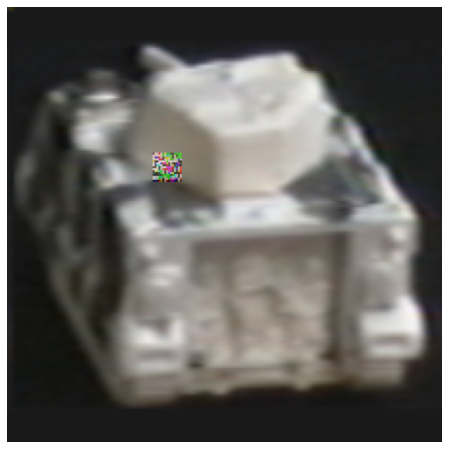

 12%|█▎        | 1/8 [00:02<00:20,  2.99s/it]

1/1 [==============================] - 0s 56ms/step
[[('n03476684', 'hair_slide', 0.16695482), ('n02877765', 'bottlecap', 0.08327997), ('n03188531', 'diaper', 0.02850097), ('n03937543', 'pill_bottle', 0.027538653), ('n01675722', 'banded_gecko', 0.023016132)]]
1/1 [==============================] - 0s 114ms/step


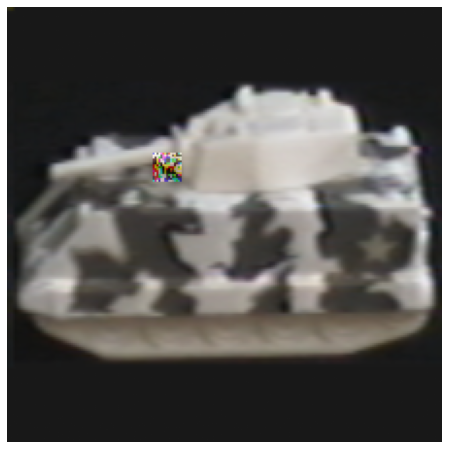

 25%|██▌       | 2/8 [00:06<00:18,  3.00s/it]

1/1 [==============================] - 0s 65ms/step
[[('n03871628', 'packet', 0.1941143), ('n03958227', 'plastic_bag', 0.08952087), ('n02951585', 'can_opener', 0.02911481), ('n03794056', 'mousetrap', 0.024506504), ('n04086273', 'revolver', 0.023494562)]]
1/1 [==============================] - 0s 117ms/step


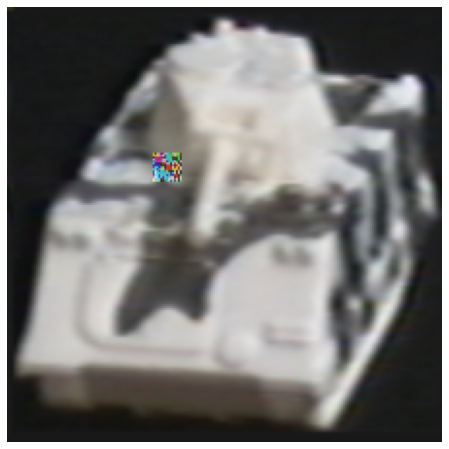

 38%|███▊      | 3/8 [00:08<00:14,  2.99s/it]

1/1 [==============================] - 0s 65ms/step
[[('n03476684', 'hair_slide', 0.18196078), ('n04026417', 'purse', 0.0929694), ('n04209133', 'shower_cap', 0.04547484), ('n01675722', 'banded_gecko', 0.038895097), ('n03916031', 'perfume', 0.03646433)]]
1/1 [==============================] - 0s 119ms/step


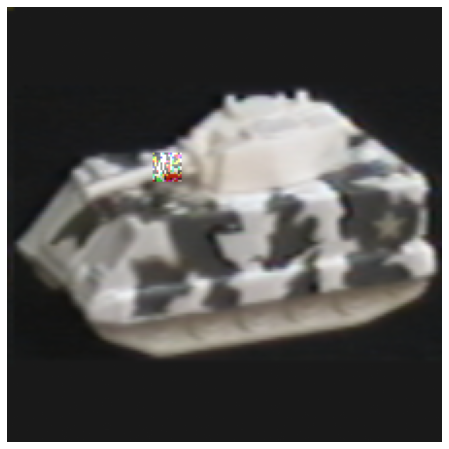

 50%|█████     | 4/8 [00:11<00:11,  2.99s/it]

1/1 [==============================] - 0s 64ms/step
[[('n03871628', 'packet', 0.09712488), ('n03709823', 'mailbag', 0.036404833), ('n03843555', 'oil_filter', 0.027217366), ('n04579432', 'whistle', 0.022275602), ('n04069434', 'reflex_camera', 0.022149255)]]
1/1 [==============================] - 0s 120ms/step


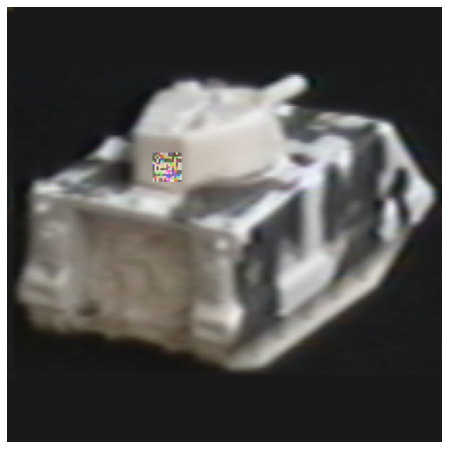

 62%|██████▎   | 5/8 [00:14<00:09,  3.00s/it]

1/1 [==============================] - 0s 54ms/step
[[('n03476684', 'hair_slide', 0.1769108), ('n01675722', 'banded_gecko', 0.11517158), ('n07613480', 'trifle', 0.11452291), ('n03188531', 'diaper', 0.038936026), ('n02948072', 'candle', 0.024492651)]]
1/1 [==============================] - 0s 121ms/step


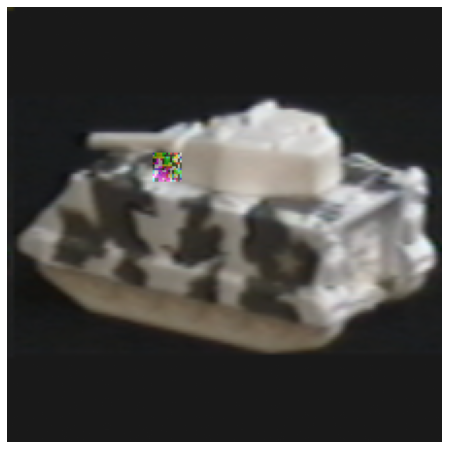

 75%|███████▌  | 6/8 [00:17<00:05,  2.98s/it]

1/1 [==============================] - 0s 55ms/step
[[('n03814639', 'neck_brace', 0.121647626), ('n03602883', 'joystick', 0.07571812), ('n04037443', 'racer', 0.066383064), ('n04285008', 'sports_car', 0.060917508), ('n04505470', 'typewriter_keyboard', 0.03615594)]]
1/1 [==============================] - 0s 120ms/step


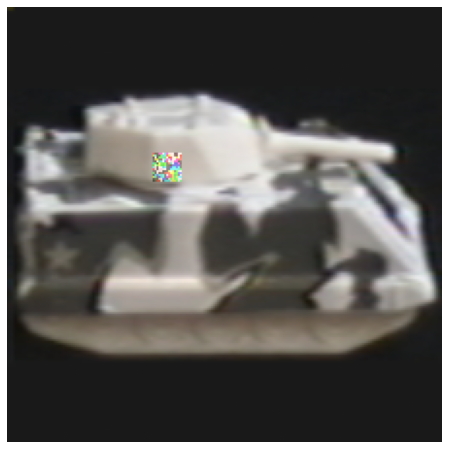

 88%|████████▊ | 7/8 [00:21<00:03,  3.02s/it]

1/1 [==============================] - 0s 56ms/step
[[('n03871628', 'packet', 0.35908857), ('n03794056', 'mousetrap', 0.11313796), ('n03666591', 'lighter', 0.06302348), ('n04389033', 'tank', 0.018242553), ('n03804744', 'nail', 0.015933797)]]
1/1 [==============================] - 0s 127ms/step


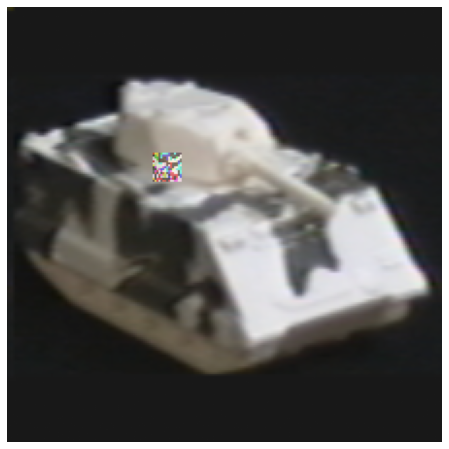

100%|██████████| 8/8 [00:24<00:00,  3.00s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_5")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_5/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(tank)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/tank.csv')

Image 6

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 59ms/step
[[('n04579432', 'whistle', 0.42193243), ('n03929660', 'pick', 0.053004637), ('n03794056', 'mousetrap', 0.012906982), ('n03775071', 'mitten', 0.012235685), ('n03666591', 'lighter', 0.011354849)]]
1/1 [==============================] - 0s 117ms/step


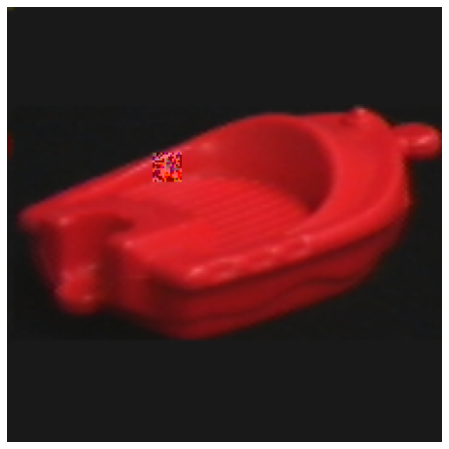

 12%|█▎        | 1/8 [00:03<00:21,  3.11s/it]

1/1 [==============================] - 0s 57ms/step
[[('n03794056', 'mousetrap', 0.077707686), ('n04372370', 'switch', 0.06489959), ('n03793489', 'mouse', 0.05357876), ('n02808440', 'bathtub', 0.05271084), ('n04579432', 'whistle', 0.04171799)]]
1/1 [==============================] - 0s 113ms/step


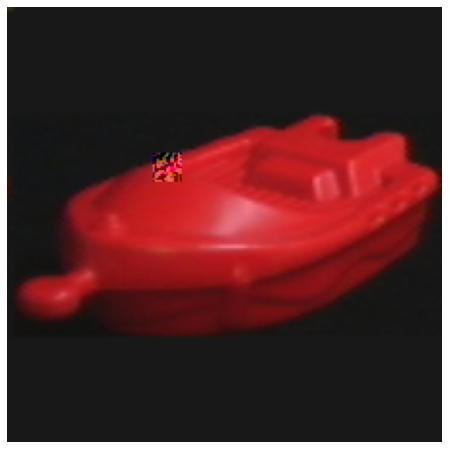

 25%|██▌       | 2/8 [00:05<00:17,  2.97s/it]

1/1 [==============================] - 0s 68ms/step
[[('n04579432', 'whistle', 0.086153194), ('n04154565', 'screwdriver', 0.08006945), ('n03793489', 'mouse', 0.05592796), ('n02860847', 'bobsled', 0.037513625), ('n04208210', 'shovel', 0.02957442)]]
1/1 [==============================] - 0s 127ms/step


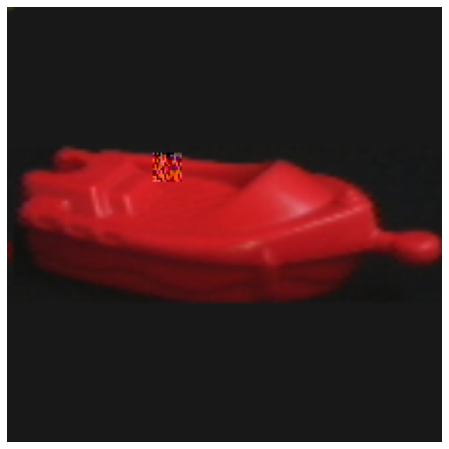

 38%|███▊      | 3/8 [00:08<00:14,  2.95s/it]

1/1 [==============================] - 0s 56ms/step
[[('n03908714', 'pencil_sharpener', 0.26553357), ('n03916031', 'perfume', 0.14406991), ('n02807133', 'bathing_cap', 0.054698028), ('n03793489', 'mouse', 0.045547165), ('n03929660', 'pick', 0.03190593)]]
1/1 [==============================] - 0s 118ms/step


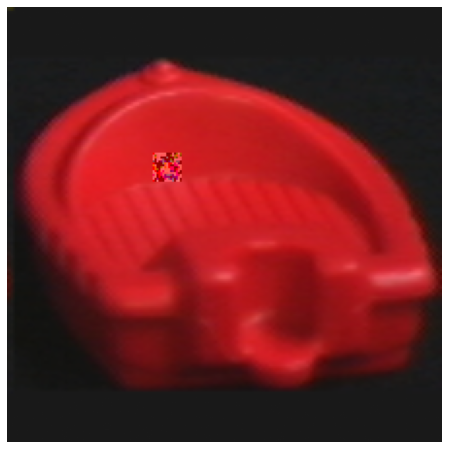

 50%|█████     | 4/8 [00:11<00:11,  2.97s/it]

1/1 [==============================] - 0s 56ms/step
[[('n04579432', 'whistle', 0.31453186), ('n03047690', 'clog', 0.0655501), ('n03666591', 'lighter', 0.03767632), ('n03676483', 'lipstick', 0.02529067), ('n03026506', 'Christmas_stocking', 0.02057178)]]
1/1 [==============================] - 0s 137ms/step


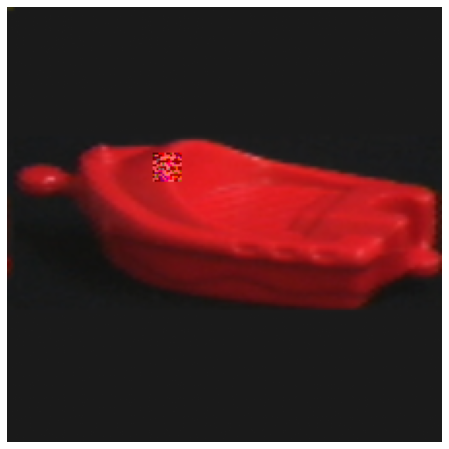

 62%|██████▎   | 5/8 [00:14<00:08,  2.98s/it]

1/1 [==============================] - 0s 55ms/step
[[('n03047690', 'clog', 0.54063493), ('n04579432', 'whistle', 0.16492634), ('n02808440', 'bathtub', 0.030846208), ('n03680355', 'Loafer', 0.028844682), ('n03124043', 'cowboy_boot', 0.010984345)]]
1/1 [==============================] - 0s 117ms/step


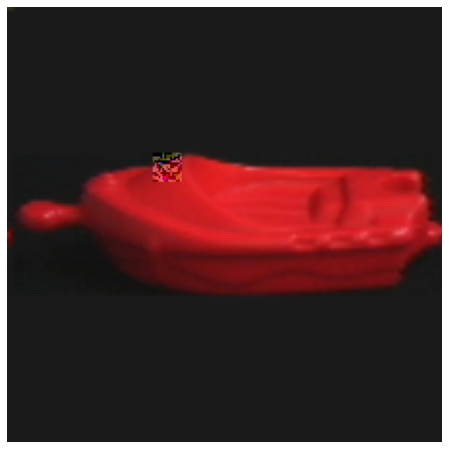

 75%|███████▌  | 6/8 [00:17<00:05,  2.90s/it]

1/1 [==============================] - 0s 60ms/step
[[('n04579432', 'whistle', 0.22717328), ('n03916031', 'perfume', 0.09919309), ('n03908714', 'pencil_sharpener', 0.09845928), ('n03793489', 'mouse', 0.06685627), ('n07720875', 'bell_pepper', 0.03500851)]]
1/1 [==============================] - 0s 120ms/step


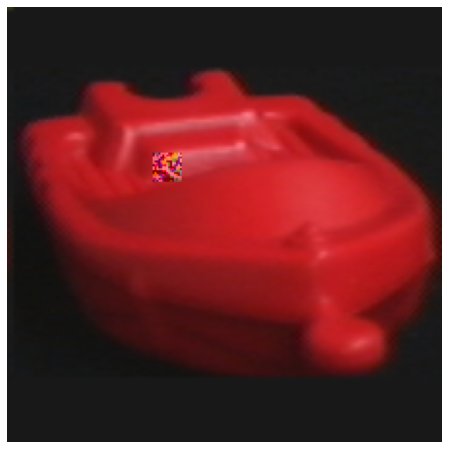

 88%|████████▊ | 7/8 [00:20<00:02,  2.91s/it]

1/1 [==============================] - 0s 55ms/step
[[('n03047690', 'clog', 0.76941913), ('n04579432', 'whistle', 0.028074348), ('n03680355', 'Loafer', 0.02052613), ('n02808440', 'bathtub', 0.0097468905), ('n03124043', 'cowboy_boot', 0.0070288116)]]
1/1 [==============================] - 0s 121ms/step


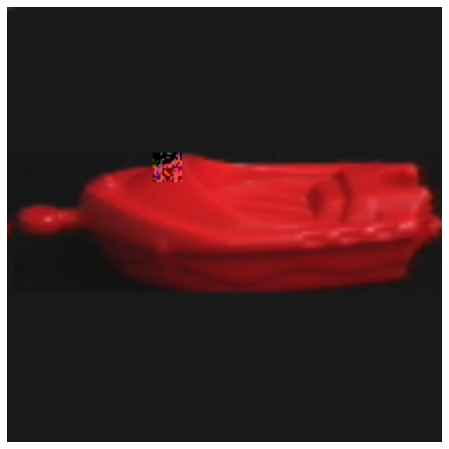

100%|██████████| 8/8 [00:23<00:00,  2.94s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_6")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_6/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(boat)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/boat.csv')

Image 7

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step
[[('n03676483', 'lipstick', 0.3402624), ('n04116512', 'rubber_eraser', 0.14327312), ('n03871628', 'packet', 0.12992348), ('n04423845', 'thimble', 0.04792165), ('n04599235', 'wool', 0.043184057)]]
1/1 [==============================] - 0s 217ms/step


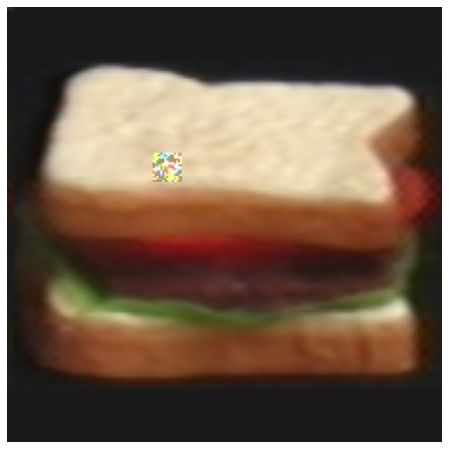

 12%|█▎        | 1/8 [00:04<00:29,  4.17s/it]

1/1 [==============================] - 0s 57ms/step
[[('n04116512', 'rubber_eraser', 0.1893342), ('n02786058', 'Band_Aid', 0.15023696), ('n03709823', 'mailbag', 0.11568377), ('n04026417', 'purse', 0.058337368), ('n04423845', 'thimble', 0.05491097)]]
1/1 [==============================] - 0s 127ms/step


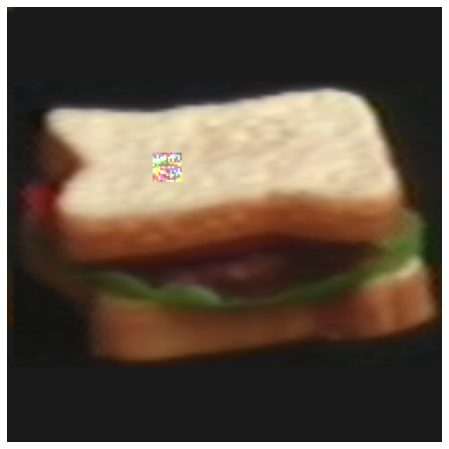

 25%|██▌       | 2/8 [00:07<00:21,  3.56s/it]

1/1 [==============================] - 0s 59ms/step
[[('n03775071', 'mitten', 0.16885276), ('n04599235', 'wool', 0.07113873), ('n04579432', 'whistle', 0.06998412), ('n04423845', 'thimble', 0.056641743), ('n04116512', 'rubber_eraser', 0.046651963)]]
1/1 [==============================] - 0s 120ms/step


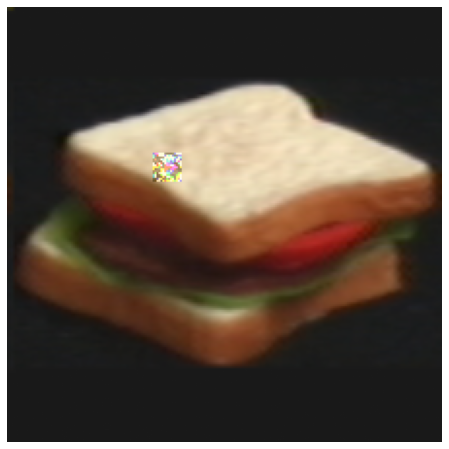

 38%|███▊      | 3/8 [00:10<00:16,  3.28s/it]

1/1 [==============================] - 0s 58ms/step
[[('n04116512', 'rubber_eraser', 0.48193827), ('n04423845', 'thimble', 0.069914736), ('n04579432', 'whistle', 0.039761785), ('n04599235', 'wool', 0.024544394), ('n03775071', 'mitten', 0.024227856)]]
1/1 [==============================] - 0s 123ms/step


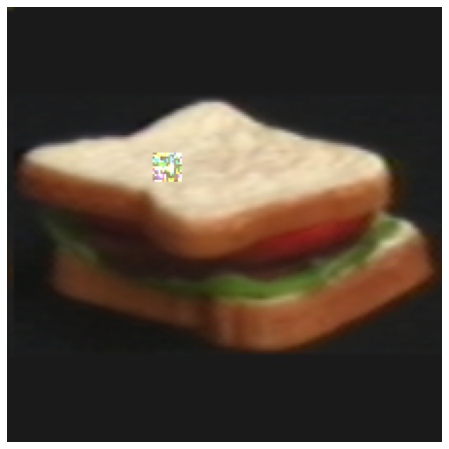

 50%|█████     | 4/8 [00:13<00:12,  3.16s/it]

1/1 [==============================] - 0s 57ms/step
[[('n03709823', 'mailbag', 0.19951071), ('n03188531', 'diaper', 0.13662913), ('n04026417', 'purse', 0.114089236), ('n04599235', 'wool', 0.08882631), ('n02786058', 'Band_Aid', 0.039123535)]]
1/1 [==============================] - 0s 117ms/step


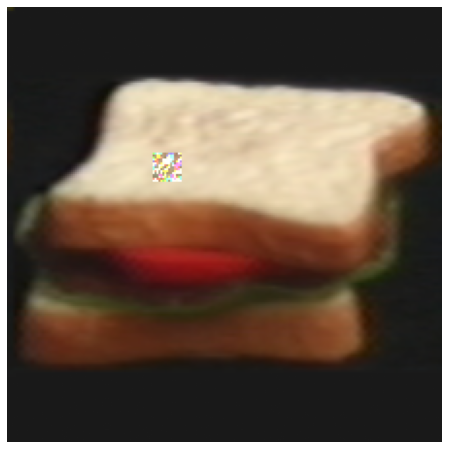

 62%|██████▎   | 5/8 [00:16<00:09,  3.10s/it]

1/1 [==============================] - 0s 56ms/step
[[('n03047690', 'clog', 0.16261867), ('n04423845', 'thimble', 0.08286895), ('n03871628', 'packet', 0.07224278), ('n02786058', 'Band_Aid', 0.045515765), ('n03775071', 'mitten', 0.03545899)]]
1/1 [==============================] - 0s 130ms/step


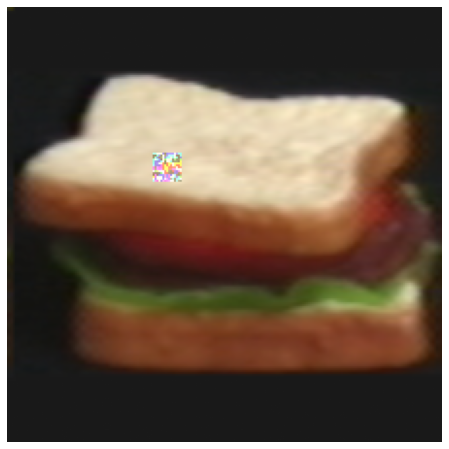

 75%|███████▌  | 6/8 [00:19<00:06,  3.07s/it]

1/1 [==============================] - 0s 58ms/step
[[('n04116512', 'rubber_eraser', 0.28400615), ('n03871628', 'packet', 0.15585697), ('n04599235', 'wool', 0.06317703), ('n03709823', 'mailbag', 0.029270643), ('n04423845', 'thimble', 0.028074972)]]
1/1 [==============================] - 0s 122ms/step


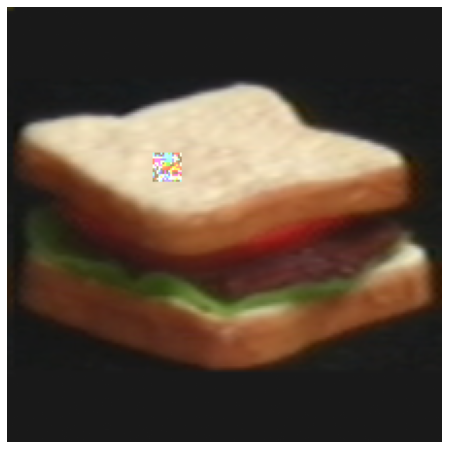

 88%|████████▊ | 7/8 [00:22<00:03,  3.07s/it]

1/1 [==============================] - 0s 55ms/step
[[('n03047690', 'clog', 0.23328273), ('n02786058', 'Band_Aid', 0.18329047), ('n04599235', 'wool', 0.054037362), ('n03709823', 'mailbag', 0.03427491), ('n03775071', 'mitten', 0.033713866)]]
1/1 [==============================] - 0s 132ms/step


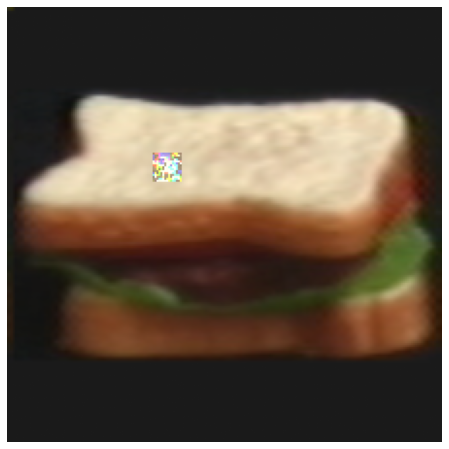

100%|██████████| 8/8 [00:25<00:00,  3.15s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_7")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_7/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(sandwich)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/sandwich.csv')

Image 8

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step
[[('n03786901', 'mortar', 0.13676846), ('n03935335', 'piggy_bank', 0.06080262), ('n03196217', 'digital_clock', 0.02822191), ('n07753592', 'banana', 0.021098604), ('n04099969', 'rocking_chair', 0.015741127)]]
1/1 [==============================] - 0s 119ms/step


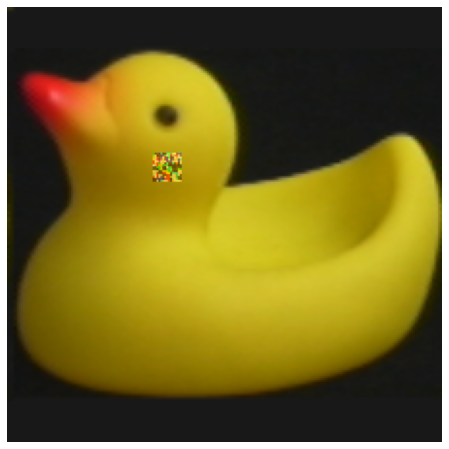

 12%|█▎        | 1/8 [00:02<00:20,  2.98s/it]

1/1 [==============================] - 0s 56ms/step
[[('n03825788', 'nipple', 0.11844905), ('n03602883', 'joystick', 0.107150264), ('n03942813', 'ping-pong_ball', 0.061844222), ('n03916031', 'perfume', 0.025410075), ('n02948072', 'candle', 0.02073275)]]
1/1 [==============================] - 0s 128ms/step


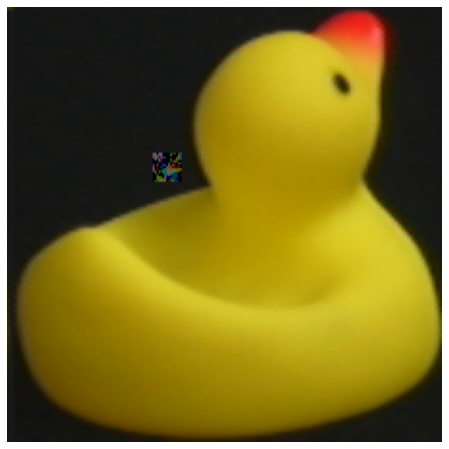

 25%|██▌       | 2/8 [00:05<00:17,  2.88s/it]

1/1 [==============================] - 0s 57ms/step
[[('n03942813', 'ping-pong_ball', 0.093554415), ('n04286575', 'spotlight', 0.066677414), ('n02782093', 'balloon', 0.051425375), ('n04380533', 'table_lamp', 0.035711758), ('n01968897', 'chambered_nautilus', 0.028306624)]]
1/1 [==============================] - 0s 130ms/step


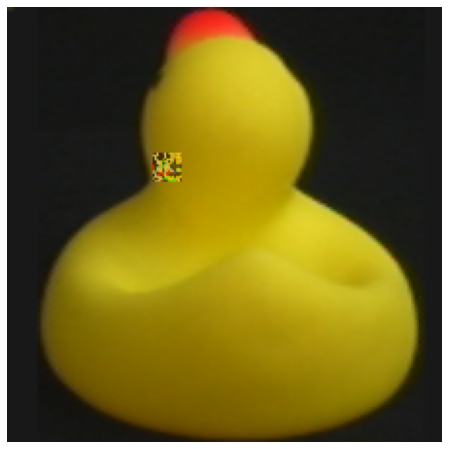

 38%|███▊      | 3/8 [00:08<00:14,  2.94s/it]

1/1 [==============================] - 0s 61ms/step
[[('n03935335', 'piggy_bank', 0.19193721), ('n03786901', 'mortar', 0.13348907), ('n07753592', 'banana', 0.023526598), ('n03196217', 'digital_clock', 0.01836648), ('n03584829', 'iron', 0.016687097)]]
1/1 [==============================] - 0s 121ms/step


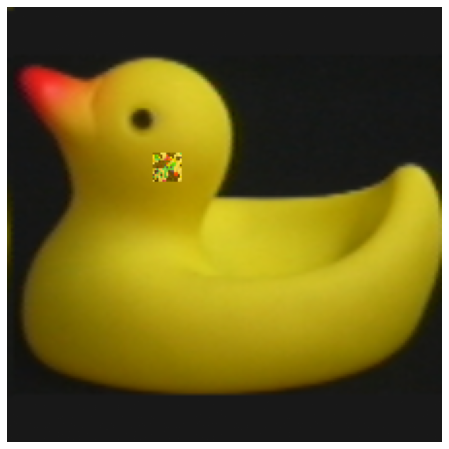

 50%|█████     | 4/8 [00:11<00:11,  2.89s/it]

1/1 [==============================] - 0s 54ms/step
[[('n03602883', 'joystick', 0.09992213), ('n07742313', 'Granny_Smith', 0.09210145), ('n04409515', 'tennis_ball', 0.08441099), ('n03825788', 'nipple', 0.0829954), ('n03786901', 'mortar', 0.040568177)]]
1/1 [==============================] - 0s 116ms/step


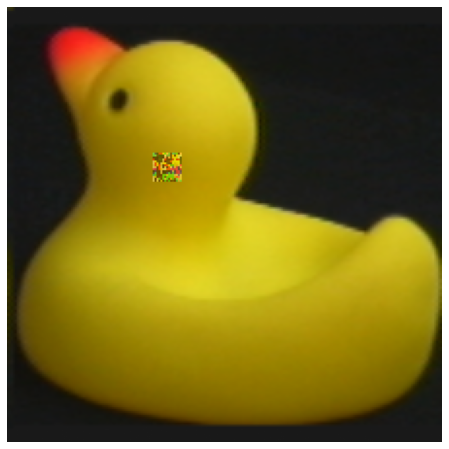

 62%|██████▎   | 5/8 [00:14<00:08,  3.00s/it]

1/1 [==============================] - 0s 59ms/step
[[('n03786901', 'mortar', 0.08245457), ('n03935335', 'piggy_bank', 0.045384172), ('n03825788', 'nipple', 0.04365921), ('n02808440', 'bathtub', 0.02456231), ('n03584829', 'iron', 0.020698851)]]
1/1 [==============================] - 0s 119ms/step


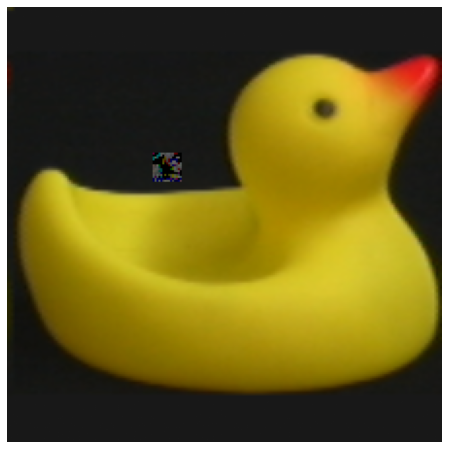

 75%|███████▌  | 6/8 [00:17<00:05,  3.00s/it]

1/1 [==============================] - 0s 56ms/step
[[('n03935335', 'piggy_bank', 0.3310247), ('n04357314', 'sunscreen', 0.033191234), ('n03196217', 'digital_clock', 0.026834797), ('n03602883', 'joystick', 0.02575412), ('n03793489', 'mouse', 0.021875799)]]
1/1 [==============================] - 0s 123ms/step


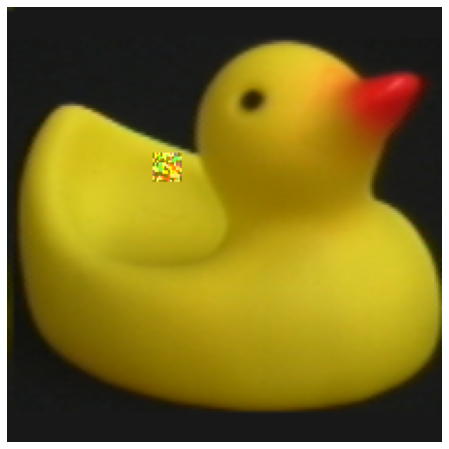

 88%|████████▊ | 7/8 [00:20<00:03,  3.03s/it]

1/1 [==============================] - 0s 60ms/step
[[('n03942813', 'ping-pong_ball', 0.13318719), ('n03916031', 'perfume', 0.07126859), ('n03793489', 'mouse', 0.046458177), ('n03935335', 'piggy_bank', 0.046455078), ('n04380533', 'table_lamp', 0.038344666)]]
1/1 [==============================] - 0s 126ms/step


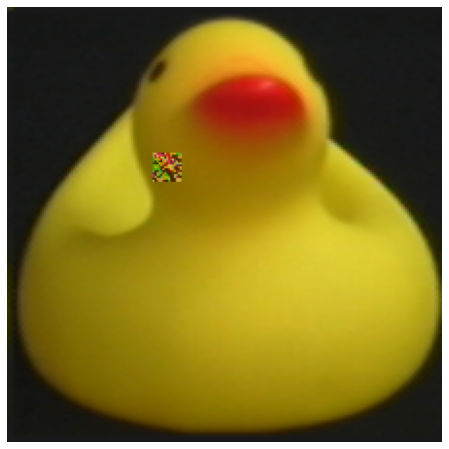

100%|██████████| 8/8 [00:23<00:00,  2.99s/it]


In [ ]:
files = os.listdir("/content/gdrive/MyDrive/Data/DAR_data/Object_8")
imgclassmobilenet = []
predsmobilenet = []
imgclassnasnet = []
predsnasnet = []
for file in tqdm(files):
    image_raw = tf.io.read_file(f"/content/gdrive/MyDrive/Data/DAR_data/Object_8/{file}")
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    create_adv_dars(duck)
    results = gen_results()

results
pd.DataFrame(results).to_csv('/content/gdrive/MyDrive/Data/DAR_data/duck.csv')